# RECONOCIMIENTO DE BIOMARCADORES CON BIOPYTHON

Comenzamos realizando la carga de paquetes necesarios:

In [5]:
import Bio
from Bio import SeqIO 
from Bio.Seq import Seq

In [6]:
pip show Biopython

Name: biopython
Version: 1.83
Summary: Freely available tools for computational molecular biology.
Home-page: https://biopython.org/
Author: The Biopython Contributors
Author-email: biopython@biopython.org
License: 
Location: c:\users\gabriel\anaconda3\lib\site-packages
Requires: numpy
Required-by: 
Note: you may need to restart the kernel to use updated packages.


## Secuencia Patológicas

Para obtener las secuencias utilizaremos la siguientes funciones:

In [7]:
#para nuestro caso únicamente serán dos tipos de extensión/formato; fasta o genbank
def obtener_tipo_extension(extension):
    diccionario_extensiones = {'fasta':'fasta','fna':'fasta','ffn':'fasta','faa':'fasta','frn':'fasta',
                  'fastq':'fastq','fq':'fastq',
                  'gb':'genbank','gbk':'genbank'}
    return diccionario_extensiones[extension]

def obtener_secuencias(ruta_archivo):
    nombre = ruta_archivo.split('.')
    extension = nombre[-1]
    tipo_ext = obtener_tipo_extension(extension)
    registros=SeqIO.parse(ruta_archivo,tipo_ext)
    lista_secuencias=[]
    for secuencia in registros:
        lista_secuencias.append(secuencia)
    return lista_secuencias

Llamamos a la función recientemente creada para abrir el archivo fasta con las secuencias patológicas de los diferentes genes, y los guardamos en una lista, para facilitar su manipulación:

In [8]:
#llamamos a la función
secs_brca1=obtener_secuencias("Datos\Datos pacientes enfermos\BRCA1 sequences.fasta")

#calculamos la cancidad de secuencias presentes aquí
print(f"En el archivo del gen BRCA1 disponemos de un total de {len(secs_brca1)} secuencias patológicas")

#llamamos a la función
secs_brca2=obtener_secuencias("Datos\Datos pacientes enfermos\BRCA2 sequences.fasta")

#calculamos la cancidad de secuencias presentes aquí
print(f"En este archivo del gen BRCA2 disponemos de un total de {len(secs_brca2)} secuencias patológicas")

#llamamos a la función
secs_tp53=obtener_secuencias("Datos\Datos pacientes enfermos\TP53 sequences.fasta")

#calculamos la cancidad de secuencias presentes aquí
print(f"En este archivo del gen TP53 disponemos de un total de {len(secs_tp53)} secuencias patológicas")

#llamamos a la función
secs_pik3ca=obtener_secuencias("Datos\Datos pacientes enfermos\PIK3CA sequences.fasta")

#calculamos la cancidad de secuencias presentes aquí
print(f"En este archivo del gen PIK3CA disponemos de un total de {len(secs_pik3ca)} secuencias patológicas")

En el archivo del gen BRCA1 disponemos de un total de 1094 secuencias patológicas
En este archivo del gen BRCA2 disponemos de un total de 220 secuencias patológicas
En este archivo del gen TP53 disponemos de un total de 953 secuencias patológicas
En este archivo del gen PIK3CA disponemos de un total de 57 secuencias patológicas


# Filtrado de las secuencias patológicas

Se comienza filtrando aquellas secuencias correspondientes a regiones codificantes (exones) de los genes de interés:

In [9]:
num_exones_brca1=list(filter(lambda secuencia: "exon" in secuencia.description.split(" "),secs_brca1))
print(f'Para el filtrado del gen BRCA1 contamos con un total de {len(num_exones_brca1)} secuencias exónicas')

num_exones_brca2=list(filter(lambda secuencia: "exon" in secuencia.description.split(" "),secs_brca2))
print(f'Para el filtrado del gen BRCA2 contamos con un total de {len(num_exones_brca2)} secuencias exónicas')

num_exones_tp53=list(filter(lambda secuencia: "exon" in secuencia.description.split(" "),secs_tp53))
print(f'Para el filtrado del gen TP53 contamos con un total de {len(num_exones_tp53)} secuencias exónicas')

num_exones_pik3ca=list(filter(lambda secuencia: "exon" in secuencia.description.split(" "),secs_pik3ca))
print(f'Para el filtrado del gen PIK3CA contamos con un total de {len(num_exones_pik3ca)} secuencias exónicas')

Para el filtrado del gen BRCA1 contamos con un total de 389 secuencias exónicas
Para el filtrado del gen BRCA2 contamos con un total de 122 secuencias exónicas
Para el filtrado del gen TP53 contamos con un total de 20 secuencias exónicas
Para el filtrado del gen PIK3CA contamos con un total de 4 secuencias exónicas


Se difine una función con la cual se obtendrá una lista de listas, las cuales contendrán la secuencia correspondiente a dicho exón:

In [10]:
def exones(num_exones_gen):
    num_exones=[]
    for exon in num_exones_gen:
        indice_num_exon = exon.description.split(" ").index("exon")+1
        num_exones.append(["exon "+exon.description.split(" ")[indice_num_exon],exon.seq])
    return num_exones

exones_brca1=exones(num_exones_brca1)
exones_brca2=exones(num_exones_brca2)
exones_tp53=exones(num_exones_tp53)
exones_pik3ca=exones(num_exones_pik3ca)

En el siguiente bloque se muestra un ejemplo de cómo quedarían las listas obtenidas:

In [11]:
print(exones_brca1)

[['exon 20', Seq('AAGATCTTCTGATCCAGTAGTGTTCTGGACATTGGACTGCTTGTCCCTGGGAAG...TTG')], ['exon 20', Seq('AAGATCTTCTGAATCCATGTAGTGTTCTGGACATTGGACTGCTTGTCCCTGGGA...GGC')], ['exon 20', Seq('AAGATCTTCTGAATCCATGTAGTGTTCTGGACATTGGACTGCTTGTCCCTGGGA...AGT')], ['exon 20', Seq('GTAGTGTTCTGGACATTGGACTGCTTGTCCCTGGGAAGTAGCAGCAGAAATCAT...AGC')], ['exon 20', Seq('TTCTGGACATTGGACTGCTTGTCCCTGGGAAGTAGCAGCAGAAATCATCAGGTG...GTT')], ['exon 11', Seq('TTTTTTGTTATTTAAGGTGAAGCAGCATCTGGGTGTGAGAGTGAAACAAGCGTC...ACA')], ['exon 11', Seq('TCTGTTTTTGTTATTTAAGGTGAAGCAGCATCTGGGTGTGAGAGTGAAACAAGC...ACA')], ['exon 15', Seq('GTCATCCCCTTCTAAATGCCCATCATTAGATGATAGGTGGTACATGCACAGTTG...TAG')], ['exon 11', Seq('GGTGAAGCAGCATCTGGGTGTGAGAGTGAAACAAGCGTCTCTGAAGACTGCTCA...TGG')], ['exon 11', Seq('AACCTCTGTTTTTGTTATTTAAGGTGAAGCAGCATCTGGGTGTGAGAGTGAAAC...CGC')], ['exon 20', Seq('AGATCTTCTGAATCCATGTAGTGTTCTGGACATTGGACTGCTTGTCCCTGGGAA...AGC')], ['exon 20', Seq('AGATCTTCTGAATCCATGTAGTGTTCTGGACATTGGACTGCTTGTCCCTGGGAA...GAG')], ['exon 11', Seq

Con las estructuras obtenidas se generan unas nuevas más optimizadas para el objetivo que se pretende obtener, se pasan de una lista de listas, a un diccionario cuyo par estará conformado por una clave que será el exón, y un lista con todas las secuencias que tuvieran asociado dicho exón. Es una forma de agrupar las secuencias.

In [12]:
def crear_dic(exones_gen):

    dict_exones={}
    
    for exon in exones_gen:
        
        if exon[0] not in dict_exones.keys():
            dict_exones[exon[0]]=[]
            
        dict_exones[exon[0]].append(exon[1])
    
    return dict_exones
    
dict_brca1=crear_dic(exones_brca1)
dict_brca2=crear_dic(exones_brca2)
dict_tp53=crear_dic(exones_tp53)
dict_pik3ca=crear_dic(exones_pik3ca)

Sobre estos diccionarios son de interés aquellos exones que presenten unas listas más largas como valores, ya que será un parámetro para determinar el número de secuencias presentes para analizar. De forma que cuanto más largas sean estas listas mayores datos, variabilidad y representación se obtendrá.  

Se crea con dicho objetivo una función que determine aquellos dos exones por cada gen que presenten un mayor número de secuencias

In [13]:
def max_secs(diccionario,corte):
    num_secs=[]
    max_exones=[]
    
    for exon in diccionario.values():
        num_secs.append(len(exon))
    """
    #ejemplo
    a=[1,2,4,2,7,2,99,53,12,30,18,2828,2]
    a.sort()
    print(a[::-1][:2])
    """
    num_secs.sort()
    num_secs_top= num_secs[::-1][:corte]
    
    secuencias_filtradas=list(filter(lambda secuencias: len(secuencias) in num_secs_top ,diccionario.values()))
    
    for secuencias in secuencias_filtradas:
        max_exones.append(list(diccionario.keys())[list(diccionario.values()).index(secuencias)])
                                  
    return max_exones
              
print(f"Los exones con mayor frecuencia de mutacion para el gen BRCA1 son : {max_secs(dict_brca1,2)}")
print(f"Los exones con mayor frecuencia de mutacion para el gen BRCA2 son : {max_secs(dict_brca2,2)}")
print(f"Los exones con mayor frecuencia de mutacion para el gen TP53 son : {max_secs(dict_tp53,2)}")
print(f"Los exones con mayor frecuencia de mutacion para el gen PIK3CA son : {max_secs(dict_pik3ca,2)}")

Los exones con mayor frecuencia de mutacion para el gen BRCA1 son : ['exon 19', 'exon 5']
Los exones con mayor frecuencia de mutacion para el gen BRCA2 son : ['exon 11', 'exon 2']
Los exones con mayor frecuencia de mutacion para el gen TP53 son : ['exon 8', 'exon 5']
Los exones con mayor frecuencia de mutacion para el gen PIK3CA son : ['exon 9', 'exon 20']


Una vez se han obtenido los exones de los que se disponen mayores secuencias, se filtran para poder utilizarlas en futuros alineamientos de secuencias en busca de posibles biomarcadores.

In [14]:
secuencias_brca1= dict(filter(lambda elemento: elemento[0] == max_secs(dict_brca1,2)[0] or elemento[0] == max_secs(dict_brca1,2)[1],map(lambda elemento: (elemento,dict_brca1[elemento]),dict_brca1)))
secuencias_brca2= dict(filter(lambda elemento: elemento[0] == max_secs(dict_brca2,2)[0] or elemento[0] == max_secs(dict_brca2,2)[1],map(lambda elemento: (elemento,dict_brca2[elemento]),dict_brca2)))
secuencias_tp53= dict(filter(lambda elemento: elemento[0] == max_secs(dict_tp53,2)[0] or elemento[0] == max_secs(dict_tp53,2)[1],map(lambda elemento: (elemento,dict_tp53[elemento]),dict_tp53)))
secuencias_pik3ca= dict(filter(lambda elemento: elemento[0] == max_secs(dict_pik3ca,2)[0] or elemento[0] == max_secs(dict_pik3ca,2)[1],map(lambda elemento: (elemento,dict_pik3ca[elemento]),dict_pik3ca)))

In [15]:
secuencias_brca1

{'exon 19': [Seq('AGAAGAGAAGTGGTCATGGGAAGAACCACCAAGGTCCAAAGCGAGCAAGAGAAT...AAG'),
  Seq('GGGGCCGGGCACCTCTCCCTCTCCGTGCGAGAGCACGTTCTTCTGCTGTATGTA...GGC'),
  Seq('GGGGAACTGACTCTCTGTCTGCGTGGGAGAGCACGTTCTTCTGCTGTATGTAAC...AAA'),
  Seq('CGTCCGGTGCTCTGGGTCTGCGCGGTAGACCACGTTCTTCGGCTATATGTAAGC...GCA'),
  Seq('CGGGTACGGACATCTCTGTCTGCGTGGGAGAGCACGTTCTTCTGCTGTATGTAA...AAA'),
  Seq('GGGTACCCTGACTCTCACTCTGCGTGAGAGAGCACGTTCTTCTGCTGTATGTAA...AAA'),
  Seq('ATTTCCGTGCTCTGGATGCTTCCGGTGCACCATGAGCTCTCGCTGAATGTGACG...CAC'),
  Seq('GGGTGCTACTCTCTTCTCCGTGAAAGAGCACGTTCTTCTGCTGTATGTAACCTG...AAA'),
  Seq('GGGGGGGTGACTCTGTATCTCGGTGAGGAGCACGTTCTTCTGCTGTATGTAACC...ACA'),
  Seq('GGGGGGCGGGCCTCTGATCTGCGTGGGAGAGCACGTTCTTCTGCTGTATGTAAC...ACA'),
  Seq('ACTTCCGGGGCCTCTCTTCTCCCTGAGAGAGCACGTTCTTCTGCTGTATGTAAC...GGC'),
  Seq('GGGGGGAGGGGAATCTCTTCTGAGTGCAGAGAGCACGTTCTTCTGCTGTATGTA...TAA'),
  Seq('CGGAACTGAACTCTCTAACTGCAATGAGAGAGCACGTTCTTCTGCTGTATGTAA...AAA'),
  Seq('CGGGTCCTAACTCTCTTCTCCGTGGAAGAGCACGTTCTTCTGCTGTATGTAACC...AA

Para finalizar la etapa de filtrado y antes de realizar cualquier tipo de alineamiento de las secuencias patológicas filtradas, se debe comprobar que las longitudes de las secuencias para cada exón de interés correspondientes no presentan grandes variaciones entre sí, y de ser así, aquellas que no cumplieran el criterio, deberían de ser descartadas.

In [16]:
#ejemplo comprobar la longitud de las secuencias
for i in secuencias_brca2["exon 11"]:
    print(len(i))

336
335
331
2145
340
334
383
394
401
593
600
551
341
312
364
361
321
264
312
364
364
353
354
5892
519
238
239
240
241


En el ejemplo anterior se observa que alguna secuencia, dista mucho de ser similar en cuanto a longitud se refiere. Por ello se deberá poner en práctica la idea comentada.

Para la realización de un correcto alineamiento es imprescindible que las longitudes correspondientes a las secuencias sean lo más similares posibles,por ello se realiza mediante la siguiente función, un filtrado de aquellas secuencias que no cumplan con el umbral establecido al presentar longitudes muy diferentes respecto del resto.

In [17]:
import statistics as stats

def calcular_mediana(dict_secuencias):
    medianas=[]
    for j in list(dict_secuencias):
        long=[]
        for i in dict_secuencias[j]:
            long.append(len(str(i)))
        mediana=stats.median(long)
        medianas.append(mediana)
    return medianas

Ya que hay toda variedad de longitudes y algunas muy diferentes de otras para un mismo exón de un mismo gen, utilizar la media no habría sido tan representativo del conjunto de secuencias, y por ello, la elección de la mediana es la correcta, consiguiendo la eliminación de los valores "out-liers" que puedieran alterar cualquier resultado del análisis.

In [18]:
#función
import statistics as stats

def comprobar_longitudes(dict_secuencias,porcentaje_umbral):
    
    #eliminar valores outliers
    
    dict={}
    medianas=calcular_mediana(dict_secuencias)
    
    for j in list(dict_secuencias):
        
        long_filtradas=[]
        
        for i in dict_secuencias[j]:
            
            if medianas[list(dict_secuencias).index(j)] - medianas[list(dict_secuencias).index(j)] * (porcentaje_umbral/100) <= len(i) <= medianas[list(dict_secuencias).index(j)] + medianas[list(dict_secuencias).index(j)] * (porcentaje_umbral/100):
                
                long_filtradas.append(i)
                
        dict[j]=long_filtradas
        
    return dict
    

In [19]:
#comprobación y filtrado
#estableciendo un porcentaje da varaiabilidad de longitud del 10% respecto a su media
secuencias_brca1_filtradas=comprobar_longitudes(secuencias_brca1,10)

secuencias_brca2_filtradas=comprobar_longitudes(secuencias_brca2,10)

secuencias_tp53_filtradas=comprobar_longitudes(secuencias_tp53,10)

secuencias_pik3ca_filtradas=comprobar_longitudes(secuencias_pik3ca,10)

#print(secuencias_brca1_filtradas)

Por otro lado, a continuación,se debe volver a crear un archivo fasta, el cual contenga las secuencias filtradas de interés, para poder hacer uso de la herramienta especificada. Para ello, se hace un filtro del archivo original con las distintas secuencias almacenadas en los diccionarios finales, añadiéndolas a un nuevo archivo fasta creado mediante la función **SeqIO.write()**; y posteriormente le será guardado.

Con la idea ya en mente, se crea la siguiente función:

In [20]:
def almacenar_sec(diccionario,secuencias_originales,gen,origen):
    
    contador=0
    
    lista_keys=list(diccionario.keys())
    
    #eliminaremos con ella posibles repeticiones de secuencias en nuestro archivo fasta
    lista_ids=[]
    
    num_llave=0
    
    while num_llave < len(lista_keys):
            
        lista_sec=[]
          
        for secuencia in secuencias_originales:
        
            
            for sec_filtrada in diccionario[lista_keys[num_llave]]:
                
                #print(str(sec_filtrada))
                
                if str(secuencia.seq)==str(sec_filtrada) and secuencia.id not in lista_ids:
                    
                    contador=contador+1
                    
                    lista_sec.append(secuencia)
                    lista_ids.append(secuencia.id)
                    
            if origen == "sana":
                SeqIO.write(lista_sec,f"Datos\Secuencias control filtradas\{gen.upper()} {lista_keys[num_llave]}.fasta","fasta")
            if origen == "enferma":
                SeqIO.write(lista_sec,f"Datos\Secuencias patológicas filtradas\{gen.upper()} {lista_keys[num_llave]}.fasta","fasta")
                    
        num_llave=num_llave+1

In [30]:
almacenar_sec(secuencias_brca1_filtradas,secs_brca1,"brca1","enferma")
almacenar_sec(secuencias_brca2_filtradas,secs_brca2,"brca2","enferma")
almacenar_sec(secuencias_tp53_filtradas,secs_tp53,"tp53","enferma")
almacenar_sec(secuencias_pik3ca_filtradas,secs_pik3ca,"pik3ca","enferma")

De esta forma obteermos finalmente las secuencias completamente filtradas:

In [117]:
#secs_brca1

# Secuencias Control

Primeramente se obtienen las secuencias disponibles de los correspondientes archivos de los exones almacenados:

In [21]:
#BRCA1
#llamamos a la función
secs_control_brca1_5=obtener_secuencias("Datos\Datos pacientes sanos\BRCA1 exon 5.fasta")

#calculamos la cancidad de secuencias presentes aquí
print(f"En el archivo del gen BRCA1 disponemos de un total de {len(secs_control_brca1_5)} secuencias sanas")

#BRCA2
#llamamos a la función
secs_control_brca2_11=obtener_secuencias("Datos\Datos pacientes sanos\BRCA2 exon 11.fasta")

#calculamos la cancidad de secuencias presentes aquí
print(f"En este archivo del exon 11 del gen BRCA2 disponemos de un total de {len(secs_control_brca2_11)} secuencias sanas")

#llamamos a la función
secs_control_brca2_2=obtener_secuencias("Datos\Datos pacientes sanos\BRCA2 exon 2.fasta")

#calculamos la cancidad de secuencias presentes aquí
print(f"En este archivo del exon 2 del gen BRCA2 disponemos de un total de {len(secs_control_brca2_11)} secuencias sanas")

#TP53
#llamamos a la función
secs_control_tp53_5=obtener_secuencias("Datos\Datos pacientes sanos\TP53 exon 5.fasta")

#calculamos la cancidad de secuencias presentes aquí
print(f"En este archivo del exon 5 del gen TP53 disponemos de un total de {len(secs_control_tp53_5)} secuencias sanas")

#llamamos a la función
secs_control_tp53_8=obtener_secuencias("Datos\Datos pacientes sanos\TP53 exon 8.fasta")

#calculamos la cancidad de secuencias presentes aquí
print(f"En este archivo del exon 8 del gen TP53 disponemos de un total de {len(secs_control_tp53_8)} secuencias sanas")

En el archivo del gen BRCA1 disponemos de un total de 5 secuencias sanas
En este archivo del exon 11 del gen BRCA2 disponemos de un total de 4 secuencias sanas
En este archivo del exon 2 del gen BRCA2 disponemos de un total de 4 secuencias sanas
En este archivo del exon 5 del gen TP53 disponemos de un total de 67 secuencias sanas
En este archivo del exon 8 del gen TP53 disponemos de un total de 61 secuencias sanas


# Filtrado de las secuencias control

Se simplifican las secuencias cargadas en listas, para un mejor manejo y facilitar de este modo la filtración:

In [22]:
exon_5_control_brca1=list(filter(lambda secuencia: "exon" in secuencia.description.split(" "),secs_control_brca1_5))

exon_2_control_brca2=list(filter(lambda secuencia: "exon" in secuencia.description.split(" "),secs_control_brca2_2))

exon_11_control_brca2=list(filter(lambda secuencia: "exon" in secuencia.description.split(" "),secs_control_brca2_11))

exones_control_brca2=exon_2_control_brca2 + exon_11_control_brca2

exon_5_control_tp53=list(filter(lambda secuencia: "exon" in secuencia.description.split(" "),secs_control_tp53_5))

exon_8_control_tp53=list(filter(lambda secuencia: "exon" in secuencia.description.split(" "),secs_control_tp53_8))

exones_control_tp53=exon_5_control_tp53 + exon_8_control_tp53

Se crean sus correspondientes diccionarios con todos los exones de interés, para este caso en menor número que las patológicas:

In [23]:
dic_exon_5_brca1=crear_dic(exones(exon_5_control_brca1))
dic_exones_brca2=crear_dic(exones(exones_control_brca2))
dic_exones_tp53=crear_dic(exones(exones_control_tp53))
dic_exon_5_brca1

{'exon 5': [Seq('TCTTATTTTTATTTGTTTACATGTCTTTTCTTATTTTAGTGTCCTTAAAAGGTT...ACC'),
  Seq('CTACTGTTGCTGCATCTTATTTTTATTTGTTTACATGTCTTTTCTTATTTTAGT...ACC'),
  Seq('ATCTTATTTTTATTTGTTTACATGTCTTTTCTTATTTTAGTGTCCTTAAAAGGT...TCA'),
  Seq('ATCTTATTTTTATTTGTTTACATGTCTTTTCTTATTTTAGTGTCCTTAAAAGGT...TCA'),
  Seq('ATCTTATTTTTATTTGTTTACATGTCTTTTCTTATTTTAGTGTCCTTAAAAGGT...CCA')]}

Se comprueba en último lugar, las longitudes de las secuencias control. Con dicho proceso ya realizado, se almacenarían en unos nuevos archivos junto a las secuencias patológicas ya filtradas


In [24]:
secuencias_control_brca1_filtradas=comprobar_longitudes(dic_exon_5_brca1,10)

secuencias_control_brca2_filtradas=comprobar_longitudes(dic_exones_brca2,10)

secuencias_control_tp53_filtradas=comprobar_longitudes(dic_exones_tp53,10)

Se almacenan las secuencias en archivos .fasta:

In [25]:
almacenar_sec(secuencias_control_brca1_filtradas,exon_5_control_brca1,"brca1","sana")
almacenar_sec(secuencias_control_brca2_filtradas,exones_control_brca2,"brca2","sana")
almacenar_sec(secuencias_control_tp53_filtradas,exones_control_tp53,"tp53","sana")

# Alineamiento de secuencias

Un alineamiento de secuencias en bioinformática es una forma de representar y comparar dos o más secuencias o cadenas de ADN, ARN, o estructuras primarias proteicas para resaltar sus zonas de similitud, que podrían indicar relaciones funcionales o evolutivas entre los genes o proteínas consultados.

### Clases de alineamiento.

Exiten dos tipos:

- **Alineamiento global**. Se comparan las secuencias enteras, pudiendo introducirse huecos que igualen longitudes de secuencias.
       **(Busca maximizar la puntuación del alinemiento para la secuencia completa)**
    - Coste computacional elevado.
    - Indicado para secuencias con alta similitud y de longitud parecida.

- **Alineamiento local**. Permite identificar secuencias con cierto grado de similitud. Se alinean las partes más parecidas.
      **(Busca maximizar la puntuación del alinemiento para regiones concretas)**
    - Util para busquedas en bases de datos de gran tamaño.
    - En realidad es un alineamiento global de secuencias cortas.


En nuestro caso realizaremos en primer lugar un alineamiento global, esto en pro de obtener las diferencias entre las distintas variantes. Posteriormente pasaremos a un alineamiento local, esta vez para poder determinar dentro de las secuencias aquellas regiones muy similares que puedan ser reconocidas, tras un análisis exahustivo, como biomarcadores patológicos de cáncer de mama.

A su vez, el número de secuencias a confrontar en nuestra situación es múltiple.

Definimos un alineamiento múltiple como una colección de tres o más secuencias de aminoacidos o nucleotidos alineados de forma parcial o completa.

## ¿Para qué puede servir el alineamiento múltiple?

- Informa sobre la función, estructura y evolución de una secuencia.
    - **Identificar patrones comunes de un grupo de secuencias (Para nuestro caso)**
    - Encontrar miembros distantes de una familia de proteinas
        - No es posible obtenerlo mediante el alineamiento por pares.
- Clasificar y generar bases de datos de proteinas una vez secuenciado el genoma completo de un organismo.
    - Predicción de estructuras secundarias y terciarias de proteinas.
- Fundamental para la generación de árboles filogenéticos.
    - Relaciones evolutivas entre secuencias.
- Permite representar familias de secuenccias para generar modelos que faciliten la identificación de miembros potenciales.
    

En el siguiente apartado trataremos con algoritmos de alineamiento múltiple global, es decir que funcionarán mejor cuando las secuencias a comparar tengan un tamaño similar. Asimismo, estos métodos se encuentran diseñados con la premisa de que el numero de *indels* (mutaciones) no sea muy elevado.

**Existen diferentes formas de obtener el alineamiento múltiple**, diferenciando los tipos de algoritmos a emplear:
- Programación dinámica (me sacan la mejor solución, cosa que no siempre se puede hacer en alineamiento múltiple)
- **Algoritmos heurísticos (sacrifican precisión a cambio de rendimiento, nos da una solución que puede que no sea la mejor)**

## Algoritmos heurísticos (no nos aseguran la mejor solución pero nos devuelven una posible solución)

Es lo que se suele utilizar en la realidad.Dado que es posible que nos encontremos con la necesidad de realizar el alineamiento de un gran número de secuencias, no es posible emplear los métodos exactos. 

Es por ello que se emplearán métodos inexactos, es decir que no pueden garantizar obtener la solución óptima, pero que que computacionalmente son aceptables.

Los algoritmos heurísticos se puede clasificar de la siguiente forma:
- **Progresivos**: Se comienza con el alineamiento de dos secuencias y de forma iterativa se van añadiendo el resto de secuencias al alineamiento. (ClustalW)
- **Iterativos**: Se realiza un alineamiento progresivo y se intenta mejorar el alineamiento moviendo, añadiendo o eliminando _gaps_. (Muscle)
- **Híbridos**: Combinan diferentes estrategias empleando información complementaria (información estructural de las proteinas o bases de datos con información de buenos alineamientos locales).

Para la utilización de los algoritmos heuristicos de alineamientos debemos instalar primero de forma local los algoritmos a utilizar, para nuestro caso , ClustalOmega y Muscle.

Una vez instalados, podremos realizar la ejecución de cada uno los programas de alineamiento mediante el módulo Align.Applications (https://biopython.org/docs/latest/api/Bio.Align.Applications.html#module-Bio.Align.Applications):

Applications.ClustalwCommandline

Applications.ClustalOmegaCommandline

Applications.MuscleCommandline

Sin embargo, desde el propio desarrollo de Biopython indican que se aconseja la ejecución de cada uno de los programas mediante subprocesos de Python (https://docs.python.org/3/library/subprocess.html). De esta forma, siempre trabajaremos con la ultima versión instalada y sin problemas de compatibilidad de las funciones de Biopython con el software instalado.

Veamos un par de ejemplos:

Comenzando por un ejemplo, con la ejecución del algoritmo de clustal para el primer exón de interés de BRCA1, el exón 5, en el caso de una secuencia patológica.

In [123]:
from Bio import AlignIO

#Ejecutar el algoritmo de Clustal
import subprocess

completed=subprocess.run(["clustalo", "-i",
                          "Datos\Secuencias patológicas filtradas\BRCA1 exon 5.fasta", "-o",
                          "Resultados\Alineamiento secuencias patológicas\Resultados alineamiento clustal\clustal algn BRCA1 exon5.afa",
                          "-v","--force",
                          "--outfmt=clu"],capture_output=True)

In [124]:
alineamiento_clustal=AlignIO.read("Resultados\Alineamiento secuencias patológicas\Resultados alineamiento clustal\clustal algn BRCA1 exon5.afa","clustal")
print(alineamiento_clustal)

Alignment with 98 rows and 402 columns
---------ATTCTTTCTACAAAAGGAAGTAA-ATTAAATTGTT...--- MG932487.1
--------------TTCTACAAAAGGAAGTAA-ATTAAATTGTT...--- MG932486.1
---------ATTCTTTCTACAAAAGGAAGTAA-ATTAAATTGTT...--- MG932485.1
--------TATTCTTTCTACAAAAGGAAGTAA-ATTAAATTGTT...--- MG932484.1
-----------TCTTTCTACAAAAGGAAGTAA-ATTAAATTGTT...--- MG932483.1
---------ATTCTTTCTACAAAAGGAAGTAA-ATTAAATTGTT...--- MG932482.1
-----------------ACAAAAAGGAAGTAA-ATTAAATTGTT...--- MG932481.1
------------------ACAAAAGGAAGTAA-ATTAAATTGTT...--- MG932480.1
---------------------AAAGGAAGTAA-ATTAAATTGTT...--- MG932479.1
----------------CTACAAAAGGAAGTAA-ATTAAATTGTT...--- MG932478.1
----------TTCTTTCTACAAAAGGAAGTAA-ATTAAATTGTT...--- MG932477.1
---------ATTCTTTCTACAAAAGGAAGTAA-ATTAAATTGTT...--- MG932476.1
------------CTTTCTACAAAAGGAAGTAA-ATTAAATTGTT...--- MG932475.1
--------TATTCTTTCTACAAAAGGAAGTAA-ATTAAATTGTT...--- MG932474.1
-----------TCTTTCTACAAAAGGAAGTAA-ATTAAATTGTT...AAA MG932473.1
---------ATTCTTTCTACAAAAGGAAGTA

De la misma forma aplicar el algoritmo iterativo de "Muscle":

In [126]:
import subprocess

completed=subprocess.run(["muscle.exe",
                          "-align", "Datos\Secuencias patológicas filtradas\BRCA1 exon 5.fasta",
                          "-output", "Resultados\Alineamiento secuencias patológicas\Resultados alineamiento muscle\muscle algn BRCA1 exon5.afa"],capture_output=True)

returncode:


 


In [128]:
alineamiento_muscle=AlignIO.read("Resultados\Alineamiento secuencias patológicas\Resultados alineamiento muscle\muscle algn BRCA1 exon19.afa","fasta")
print(alineamiento_muscle)

Alignment with 88 rows and 276 columns
GGGGG--A-C-C------TGCC-TC-TC---T-TCT-A-C-T-T...-GA MH027282.1
AGGG---------------GAC-TC-CT-C-T-TCT-C-C-G-T...--A MH027254.1
CGCC-----C-A------CGCC-TC-TC-T-A-TCT-A-G-G-T...TAG MH027239.1
CGGGA----A-C------CGAC-TC-TC---T-TCT-C-C-G-T...AAA MH027238.1
CGGGC--C-C-G------TACC-CC-GA---A-AAT-G-C-A-T...CAC MH027276.1
AGAAA----A-G------TGAC-TC-TC---T-TCT-C-A-G-T...TGA MH027249.1
CGGGG--G-C-T------CCCT-CC-TA-T-G-GAT-G-C-G-T...TGA MH027220.1
AGGGT----C-T------GACC-TC-CC-CAA-TCT-A-A-G-T...-AA MH027223.1
CGTG-----G-C------TGAC-TC-TC---T-TCT-C---G-T...AAG MH027280.1
CGTCC----C-G------GACC-TC-TC-T-A-TCT-G-C-G-T...-AA MH027236.1
CGGGC--C-C-T------TAAC-TC-TC---T-TCT-G-C-G-T...AAA MH027265.1
GGGGG--G-G--------TGAC-TC-TG-T-A-TCT-C-G-G-T...ACA MH027297.1
GGGTT--C-G-G------GACC-TC-TG-T-A-TCT-C-C-G-T...AGG MH027269.1
GGAA-----C-C------GGAC-TC-TC-C-A-TCT-G-C-GGT...-GA MH027216.1
GGGGG--TTC-C------TGAA-TC-TC---T-TCT-G-C-G-T...AGG MH027255.1
GGGC-----G-C------CCAA-TC-TC---

Para una mejor implementación y limpieza, relizamos la creación de un método genérico para la obtención de algoritmos con el nombre de "obtener_alineamiento"

In [26]:
def realizar_alineamiento(algoritmo,ruta_secuencias,ruta_alineamiento):
    if algoritmo == "clustalo":
        
        subprocess.run([algoritmo, "-i",ruta_secuencias, "-o",ruta_alineamiento,"-v","--force","--outfmt=fasta"],capture_output=True)
        
    elif algoritmo== "muscle.exe":
        
        subprocess.run([algoritmo,"-align", ruta_secuencias,"-output", ruta_alineamiento],capture_output=True)

In [29]:
from Bio import AlignIO
def obtener_alineamientos(ruta_alineamiento,formato):

    alineamientos=AlignIO.read(ruta_alineamiento,formato)
        
    return alineamientos

# Alineamiento Secuencias Patológicas

## Alineamiento patológicas mediante Clustal 

Ahora realizamos los alineamientos con las secuencias filtradas para el algoritmo "Clustal":

In [184]:
realizar_alineamiento("clustalo","Datos\Secuencias patológicas filtradas\BRCA1 exon 5.fasta","Resultados\Alineamiento secuencias patológicas\Resultados alineamiento clustal\clustal algn BRCA1 exon5.afa")
realizar_alineamiento("clustalo","Datos\Secuencias patológicas filtradas\BRCA1 exon 19.fasta","Resultados\Alineamiento secuencias patológicas\Resultados alineamiento clustal\clustal algn BRCA1 exon19.afa")

realizar_alineamiento("clustalo","Datos\Secuencias patológicas filtradas\BRCA2 exon 2.fasta","Resultados\Alineamiento secuencias patológicas\Resultados alineamiento clustal\clustal algn BRCA2 exon2.afa")
realizar_alineamiento("clustalo","Datos\Secuencias patológicas filtradas\BRCA2 exon 11.fasta","Resultados\Alineamiento secuencias patológicas\Resultados alineamiento clustal\clustal algn BRCA2 exon11.afa")

realizar_alineamiento("clustalo","Datos\Secuencias patológicas filtradas\TP53 exon 5.fasta","Resultados\Alineamiento secuencias patológicas\Resultados alineamiento clustal\clustal algn TP53 exon5.afa")
realizar_alineamiento("clustalo","Datos\Secuencias patológicas filtradas\TP53 exon 8.fasta","Resultados\Alineamiento secuencias patológicas\Resultados alineamiento clustal\clustal algn TP53 exon8.afa")

realizar_alineamiento("clustalo","Datos\Secuencias patológicas filtradas\PIK3CA exon 9.fasta","Resultados\Alineamiento secuencias patológicas\Resultados alineamiento clustal\clustal algn PIK3CA exon9.afa")
realizar_alineamiento("clustalo","Datos\Secuencias patológicas filtradas\PIK3CA exon 20.fasta","Resultados\Alineamiento secuencias patológicas\Resultados alineamiento clustal\clustal algn PIK3CA exon20.afa")

Y guardamos cada resultado en una variable global.

In [30]:
p_c_algn_brca1_exon5=obtener_alineamientos("Resultados\Alineamiento secuencias patológicas\Resultados alineamiento clustal\clustal algn BRCA1 exon5.afa","fasta")
p_c_algn_brca1_exon19=obtener_alineamientos("Resultados\Alineamiento secuencias patológicas\Resultados alineamiento clustal\clustal algn BRCA1 exon19.afa","fasta")

p_c_algn_brca2_exon2=obtener_alineamientos("Resultados\Alineamiento secuencias patológicas\Resultados alineamiento clustal\/clustal algn BRCA2 exon2.afa","fasta")
p_c_algn_brca2_exon11=obtener_alineamientos("Resultados\Alineamiento secuencias patológicas\Resultados alineamiento clustal\clustal algn BRCA2 exon11.afa","fasta")
                                        
p_c_algn_tp53_exon5=obtener_alineamientos("Resultados\Alineamiento secuencias patológicas\Resultados alineamiento clustal\clustal algn BRCA2 exon11.afa","fasta")
p_c_algn_tp53_exon8=obtener_alineamientos("Resultados\Alineamiento secuencias patológicas\Resultados alineamiento clustal\clustal algn TP53 exon8.afa","fasta")

p_c_algn_pik3ca_exon9=obtener_alineamientos("Resultados\Alineamiento secuencias patológicas\Resultados alineamiento clustal\clustal algn PIK3CA exon9.afa","fasta")

## Alineamientos patológicas mediante Muscle

Realizamos los correspondientes alineamientos con el método creado para el algoritmo de "Muscle", guardando cada uno de ellos en variables globales:

In [165]:
realizar_alineamiento("muscle.exe","Datos\Secuencias patológicas filtradas\BRCA1 exon 5.fasta","Resultados\Alineamiento secuencias patológicas\Resultados alineamiento muscle\muscle algn BRCA1 exon5.afa")
realizar_alineamiento("muscle.exe","Datos\Secuencias patológicas filtradas\BRCA1 exon 19.fasta","Resultados\Alineamiento secuencias patológicas\Resultados alineamiento muscle\muscle algn BRCA1 exon19.afa")

realizar_alineamiento("muscle.exe","Datos\Secuencias patológicas filtradas\BRCA2 exon 2.fasta","Resultados\Alineamiento secuencias patológicas\Resultados alineamiento muscle\muscle algn BRCA2 exon2.afa")
realizar_alineamiento("muscle.exe","Datos\Secuencias patológicas filtradas\BRCA2 exon 11.fasta","Resultados\Alineamiento secuencias patológicas\Resultados alineamiento muscle\muscle algn BRCA2 exon11.afa")

realizar_alineamiento("muscle.exe","Datos\Secuencias patológicas filtradas\TP53 exon 5.fasta","Resultados\Alineamiento secuencias patológicas\Resultados alineamiento muscle\muscle algn TP53 exon5.afa")
realizar_alineamiento("muscle.exe","Datos\Secuencias patológicas filtradas\TP53 exon 8.fasta","Resultados\Alineamiento secuencias patológicas\Resultados alineamiento muscle\muscle algn TP53 exon8.afa")

realizar_alineamiento("muscle.exe","Datos\Secuencias patológicas filtradas\PIK3CA exon 9.fasta","Resultados\Alineamiento secuencias patológicas\Resultados alineamiento muscle\muscle algn PIK3CA exon9.afa")
realizar_alineamiento("muscle.exe","Datos\Secuencias patológicas filtradas\PIK3CA exon 20.fasta","Resultados\Alineamiento secuencias patológicas\Resultados alineamiento muscle\muscle algn PIK3CA exon20.afa")

In [31]:
p_m_algn_brca1_exon5=obtener_alineamientos("Resultados\Alineamiento secuencias patológicas\Resultados alineamiento muscle\muscle algn BRCA1 exon5.afa","fasta")
p_m_algn_brca1_exon19=obtener_alineamientos("Resultados\Alineamiento secuencias patológicas\Resultados alineamiento muscle\muscle algn BRCA1 exon19.afa","fasta")

p_m_algn_brca2_exon2=obtener_alineamientos("Resultados\Alineamiento secuencias patológicas\Resultados alineamiento muscle\muscle algn BRCA2 exon2.afa","fasta")
p_m_algn_brca2_exon11=obtener_alineamientos("Resultados\Alineamiento secuencias patológicas\Resultados alineamiento muscle\muscle algn BRCA2 exon11.afa","fasta")

p_m_algn_tp53_exon5=obtener_alineamientos("Resultados\Alineamiento secuencias patológicas\Resultados alineamiento muscle\muscle algn TP53 exon5.afa","fasta")
p_m_algn_tp53_exon8=obtener_alineamientos("Resultados\Alineamiento secuencias patológicas\Resultados alineamiento muscle\muscle algn TP53 exon8.afa","fasta")

p_m_algn_pik3ca_exon9=obtener_alineamientos("Resultados\Alineamiento secuencias patológicas\Resultados alineamiento muscle\muscle algn PIK3CA exon9.afa","fasta")

# Alineamiento secuencias control

Como se realizó en su momento con las secuencias patológicas, ahora con las secuencias control:

## Alineamientos control mediante Clustal

Empezando por el alineamiento clustal correspondiente: 

In [306]:
realizar_alineamiento("clustalo","Datos/Secuencias control filtradas/BRCA1 exon 5.fasta","Resultados/Alineamiento secuencias control/Resultados alineamiento clustal/clustal control algn BRCA1 exon5.afa")
realizar_alineamiento("clustalo","Datos/Secuencias control filtradas/BRCA2 exon 11.fasta","Resultados/Alineamiento secuencias control/Resultados alineamiento clustal/clustal control algn BRCA2 exon11.afa")
realizar_alineamiento("clustalo","Datos/Secuencias control filtradas/TP53 exon 5.fasta","Resultados/Alineamiento secuencias control/Resultados alineamiento clustal/clustal control algn TP53 exon5.afa")
realizar_alineamiento("clustalo","Datos/Secuencias control filtradas/TP53 exon 8.fasta","Resultados/Alineamiento secuencias control/Resultados alineamiento clustal/clustal control algn TP53 exon8.afa")

In [32]:
c_c_algn_brca1_exon5=obtener_alineamientos("Resultados/Alineamiento secuencias control/Resultados alineamiento clustal/clustal control algn BRCA1 exon5.afa","fasta")
c_c_algn_brca2_exon11=obtener_alineamientos("Resultados/Alineamiento secuencias control/Resultados alineamiento clustal/clustal control algn BRCA2 exon11.afa","fasta")

c_c_algn_tp53_exon5=obtener_alineamientos("Resultados/Alineamiento secuencias control/Resultados alineamiento clustal/clustal control algn TP53 exon5.afa","fasta")
c_c_algn_tp53_exon8=obtener_alineamientos("Resultados/Alineamiento secuencias control/Resultados alineamiento clustal/clustal control algn TP53 exon8.afa","fasta")                    

In [42]:
print(c_c_algn_brca1_exon5)

Alignment with 5 rows and 372 columns
--------------TCTTATTTTTATTTGTTTACATGTCTTTTC...--- OR780020.1
CTACTGTTGCTGCATCTTATTTTTATTTGTTTACATGTCTTTTC...--- OR780019.1
-------------ATCTTATTTTTATTTGTTTACATGTCTTTTC...TCA OR780018.1
-------------ATCTTATTTTTATTTGTTTACATGTCTTTTC...TCA OR780017.1
-------------ATCTTATTTTTATTTGTTTACATGTCTTTTC...A-- OR780016.1


## Alineamientos control mediante Muscle

Y finalizando con el alineamiento muscle correspondiente:

In [309]:
realizar_alineamiento("muscle.exe","Datos/Secuencias control filtradas/BRCA1 exon 5.fasta","Resultados/Alineamiento secuencias control/Resultados alineamiento muscle/muscle control algn BRCA1 exon5.afa")
realizar_alineamiento("muscle.exe","Datos/Secuencias control filtradas/BRCA2 exon 11.fasta","Resultados/Alineamiento secuencias control/Resultados alineamiento muscle/muscle control algn BRCA2 exon11.afa")
realizar_alineamiento("muscle.exe","Datos/Secuencias control filtradas/TP53 exon 5.fasta","Resultados/Alineamiento secuencias control/Resultados alineamiento muscle/muscle control algn TP53 exon5.afa")
realizar_alineamiento("muscle.exe","Datos/Secuencias control filtradas/TP53 exon 8.fasta","Resultados/Alineamiento secuencias control/Resultados alineamiento muscle/muscle control algn TP53 exon8.afa")

In [33]:
c_m_algn_brca1_exon5=obtener_alineamientos("Resultados\Alineamiento secuencias control\Resultados alineamiento muscle\muscle control algn BRCA1 exon5.afa","fasta")
c_m_algn_brca2_exon11=obtener_alineamientos("Resultados\Alineamiento secuencias control\Resultados alineamiento muscle\muscle control algn BRCA2 exon11.afa","fasta")

c_m_algn_tp53_exon5=obtener_alineamientos("Resultados\Alineamiento secuencias control\Resultados alineamiento muscle\muscle control algn TP53 exon5.afa","fasta")
c_m_algn_tp53_exon8=obtener_alineamientos("Resultados\Alineamiento secuencias control\Resultados alineamiento muscle\muscle control algn TP53 exon8.afa","fasta")

# Obtención de secuencias consenso

In [ ]:
from Bio.SeqRecord import SeqRecord
from Bio.Align import MultipleSeqAlignment

def crear_MultipleSeqAlignment(archivo,formato):
    
    #leer archivo:
    
    alineamientos=list(Align.read(archivo,formato))
    
    lista_alineamientos=[]
    
    cont=1
    
    for alineamiento in alineamientos:
        
        objeto_SeqRecord=SeqRecord(Seq(alineamiento),id="alineamiento "+ str(cont) )
        
        lista_alineamientos.append(objeto_SeqRecord)
        
        cont=cont+1
        
    multiples_alineamientos=MultipleSeqAlignment(lista_alineamientos)
    
    return multiples_alineamientos

In [74]:
from Bio.Align import AlignInfo 

def obtener_consenso_archivo(archivo,formato):
    
    msa=crear_MultipleSeqAlignment(archivo,formato)
    
    resumen_alineamiento_msa=AlignInfo.SummaryInfo(msa)
    
    sec_consenso=resumen_alineamiento_msa.dumb_consensus()
    
    return sec_consenso

def obtener_consenso(msa):
    
    resumen_alineamiento_msa=AlignInfo.SummaryInfo(msa)
    
    sec_consenso=resumen_alineamiento_msa.dumb_consensus()
    
    return sec_consenso


def guardar_consenso(sec_consenso,info,ruta_archivo,formato):
    
    info_separado=info.split('-')
    
    num_id=info_separado[0]
    
    descripcion=info_separado[1]
    
    objeto_seqRecord=SeqRecord(sec_consenso,id=num_id,description=descripcion)
    
    SeqIO.write(objeto_seqRecord,ruta_archivo,formato)
    
    

Obtenemos con ello las secuencias consenso de cada alineamiento multiple de secuencias realizado:

In [75]:
import warnings

def fxn():
    warnings.warn("deprecated", DeprecationWarning)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    fxn()

In [77]:
#Patológicas

#Clustal
p_clustal_consenso_brca1_5=obtener_consenso(p_c_algn_brca1_exon5)
p_clustal_consenso_brca1_19=obtener_consenso(p_c_algn_brca1_exon19)
p_clustal_consenso_brca2_2=obtener_consenso(p_c_algn_brca2_exon2)
p_clustal_consenso_brca2_11=obtener_consenso(p_c_algn_brca2_exon11)
p_clustal_consenso_tp53_5=obtener_consenso(p_c_algn_tp53_exon5)
p_clustal_consenso_tp53_8=obtener_consenso(p_c_algn_tp53_exon8)
p_clustal_consenso_pik3ca_9=obtener_consenso(p_c_algn_pik3ca_exon9)

#Muscle
p_muscle_consenso_brca1_5=obtener_consenso(p_m_algn_brca1_exon5)
p_muscle_consenso_brca1_19=obtener_consenso(p_m_algn_brca1_exon19)
p_muscle_consenso_brca2_2=obtener_consenso(p_m_algn_brca2_exon2)
p_muscle_consenso_brca2_11=obtener_consenso(p_m_algn_brca2_exon11)
p_muscle_consenso_tp53_5=obtener_consenso(p_m_algn_tp53_exon5)
p_muscle_consenso_tp53_8=obtener_consenso(p_m_algn_tp53_exon8)
p_muscle_consenso_pik3ca_9=obtener_consenso(p_m_algn_pik3ca_exon9)

fxn()

C:\Users\Gabriel\AppData\Local\Temp\ipykernel_14280\3704116478.py:4: DeprecationWarning: deprecated
  warnings.warn("deprecated", DeprecationWarning)


In [78]:
#Control

#Clustal
c_clustal_consenso_brca1_5=obtener_consenso(c_c_algn_brca1_exon5)
c_clustal_consenso_brca2_11=obtener_consenso(c_c_algn_brca2_exon11)
c_clustal_consenso_tp53_5=obtener_consenso(c_c_algn_tp53_exon5)
c_clustal_consenso_tp53_8=obtener_consenso(c_c_algn_tp53_exon8)

#Muscle
c_muscle_consenso_brca1_5=obtener_consenso(c_m_algn_brca1_exon5)
c_muscle_consenso_brca2_11=obtener_consenso(c_m_algn_brca2_exon11)
c_muscle_consenso_tp53_5=obtener_consenso(c_m_algn_tp53_exon5)
c_muscle_consenso_tp53_8=obtener_consenso(c_m_algn_tp53_exon8)

In [360]:
#Guardado de todas las secuencias consenso

#Patológicas
#Clustal
guardar_consenso(p_clustal_consenso_brca1_5,'P_C_BRCA1_5-consensus patologic clustal BRCA1 exon5',"Resultados\Secuencias consenso\Patológicas\Clustal\consenso patologica clustal BRCA1 exon5.fasta","fasta")
guardar_consenso(p_clustal_consenso_brca1_19,'P_C_BRCA1_19-consensus patologic clustal BRCA1 exon19',"Resultados\Secuencias consenso\Patológicas\Clustal\consenso patologica clustal BRCA1 exon19.fasta","fasta")
guardar_consenso(p_clustal_consenso_brca2_2,'P_C_BRCA2_2-consensus patologic clustal BRCA2 exon2',"Resultados\Secuencias consenso\Patológicas\Clustal\consenso patologica clustal BRCA2 exon2.fasta","fasta")
guardar_consenso(p_clustal_consenso_brca2_11,'P_C_BRCA2_11-consensus patologic clustal BRCA2 exon11',"Resultados\Secuencias consenso\Patológicas\Clustal\consenso patologica clustal BRCA2 exon11.fasta","fasta")
guardar_consenso(p_clustal_consenso_tp53_5,'P_C_TP53_5-consensus patologic clustal TP53 exon5',"Resultados\Secuencias consenso\Patológicas\Clustal\consenso patologica clustal TP53 exon5.fasta","fasta")
guardar_consenso(p_clustal_consenso_tp53_8,'P_C_TP53_5-consensus patologic clustal TP53 exon8',"Resultados\Secuencias consenso\Patológicas\Clustal\consenso patologica clustal TP53 exon8.fasta","fasta")
guardar_consenso(p_clustal_consenso_pik3ca_9,'P_C_pik3ca_9-consensus patologic clustal PIK3CA exon9',"Resultados\Secuencias consenso\Patológicas\Clustal\consenso patologica clustal PIK3CA exon9.fasta","fasta")


#Muscle
guardar_consenso(p_muscle_consenso_brca1_5,'P_M_BRCA1_5-consensus patologic muscle BRCA1 exon5',"Resultados\Secuencias consenso\Patológicas\Muscle\consenso patologica muscle BRCA1 exon5.fasta","fasta")
guardar_consenso(p_muscle_consenso_brca1_19,'P_M_BRCA1_19-consensus patologic muscle BRCA1 exon19',"Resultados\Secuencias consenso\Patológicas\Muscle\consenso patologica muscle BRCA1 exon19.fasta","fasta")
guardar_consenso(p_muscle_consenso_brca2_2,'P_M_BRCA2_2-consensus patologic muscle BRCA2 exon2',"Resultados\Secuencias consenso\Patológicas\Muscle\consenso patologica muscle BRCA2 exon2.fasta","fasta")
guardar_consenso(p_muscle_consenso_brca2_11,'P_M_BRCA2_11-consensus patologic muscle BRCA2 exon11',"Resultados\Secuencias consenso\Patológicas\Muscle\consenso patologica muscle BRCA2 exon11.fasta","fasta")
guardar_consenso(p_muscle_consenso_tp53_5,'P_M_TP53_5-consensus patologic muscle TP53 exon5',"Resultados\Secuencias consenso\Patológicas\Muscle\consenso patologica muscle TP53 exon5.fasta","fasta")
guardar_consenso(p_muscle_consenso_tp53_8,'P_M_TP53_8-consensus patologic muscle TP53 exon8',"Resultados\Secuencias consenso\Patológicas\Muscle\consenso patologica muscle TP53 exon8.fasta","fasta")
guardar_consenso(p_muscle_consenso_pik3ca_9,'P_M_PIK3CA_9-consensus patologic muscle PIK3CA exon9',"Resultados\Secuencias consenso\Patológicas\Muscle\consenso patologica muscle PIK3CA exon9.fasta","fasta")

#Control
#Clustal
guardar_consenso(c_clustal_consenso_brca1_5,'C_C_BRCA1_5-consensus control clustal BRCA1 exon5',"Resultados\Secuencias consenso\Control\Clustal\consenso control clustal BRCA1 exon5.fasta","fasta")
guardar_consenso(c_clustal_consenso_brca2_11,'C_C_BRCA2_11-consensus control clustal BRCA2 exon11',"Resultados\Secuencias consenso\Control\Clustal\consenso control clustal BRCA2 exon11.fasta","fasta")
guardar_consenso(c_clustal_consenso_tp53_5,'C_C_TP53_5-consensus control clustal TP53 exon5',"Resultados\Secuencias consenso\Control\Clustal\consenso control clustal TP53 exon5.fasta","fasta")
guardar_consenso(c_clustal_consenso_tp53_8,'C_C_TP53_8-consensus control clustal TP53 exon8',"Resultados\Secuencias consenso\Control\Clustal\consenso control clustal TP53 exon8.fasta","fasta")

#Muscle
guardar_consenso(c_muscle_consenso_brca1_5,'C_M_BRCA1_5-consensus control muscle BRCA1 exon5',"Resultados\Secuencias consenso\Control\Muscle\consenso control muscle BRCA1 exon5.fasta","fasta")
guardar_consenso(c_muscle_consenso_brca2_11,'C_M_BRCA2_11-consensus control muscle BRCA2 exon11',"Resultados\Secuencias consenso\Control\Muscle\consenso control muscle BRCA2 exon11.fasta","fasta")
guardar_consenso(c_muscle_consenso_tp53_5,'C_M_TP53_5-consensus control muscle TP53 exon5',"Resultados\Secuencias consenso\Control\Muscle\consenso control muscle TP53 exon5.fasta","fasta")
guardar_consenso(c_muscle_consenso_tp53_8,'C_M_TP53_8-consensus control muscle TP53 exon8',"Resultados\Secuencias consenso\Control\Muscle\consenso control muscle TP53 exon8.fasta","fasta")

# Obtención de diccionarios de variantes

Se emplearán dos tablas de variantes procedentes de la base de datos de GnomAD para el estudio de los exones 11 y 9 de los genes BRCA2 y PIK3CA correspondientes.

In [42]:
import pandas as pd

In [43]:
#Se realiza el cargado de las tablas
tabla_brca2=pd.read_csv("Datos\Tablas variantes\Tabla variantes BRCA2.csv")
tabla_pik3ca=pd.read_csv("Datos\Tablas variantes\Tabla variantes PIK3CA.csv")

### BRCA2 exon 11

In [44]:
#Genero un nuevo dataframe
nueva_tabla_brca2=tabla_brca2.filter(items=['gnomAD ID','Position','Protein Consequence','Transcript Consequence','VEP Annotation','ClinVar Clinical Significance','ClinVar Variation ID','Allele Count','Allele Number','Allele Frequency'])

In [45]:
#columna utilizada en el proceso de filtrado
columna_id=nueva_tabla_brca2["gnomAD ID"]

In [46]:
#lista de ids de de las mutaciones de interés filtradas
#(regiones obtenidas del navegador genómico de UCSC)
lista_ids_exon11=list(filter(lambda registro: 32336250<=int(registro.split("-")[1])<=32341200 ,columna_id))
print(lista_ids_exon11)

['13-32341197-G-A', '13-32341196-G-C', '13-32341194-T-C', '13-32341194-TG-T', '13-32341193-G-T', '13-32341192-A-T', '13-32341192-A-G', '13-32341190-T-C', '13-32341187-A-G', '13-32341184-C-G', '13-32341183-C-T', '13-32341182-C-A', '13-32341178-G-A', '13-32341176-G-T', '13-32341173-G-A', '13-32341172-AGAG-A', '13-32341170-G-A', '13-32341168-AAGAAG-A', '13-32341167-AAAG-A', '13-32341164-GA-G', '13-32341163-G-A', '13-32341162-T-C', '13-32341161-T-C', '13-32341160-ATTGGAAAAAGAAGAGGAGAGCCCC-A', '13-32341158-G-A', '13-32341158-G-C', '13-32341157-A-G', '13-32341151-A-C', '13-32341149-C-A', '13-32341147-G-C', '13-32341146-T-G', '13-32341145-T-C', '13-32341141-G-T', '13-32341141-G-A', '13-32341140-T-TG', '13-32341140-T-G', '13-32341139-A-G', '13-32341138-A-C', '13-32341138-A-G', '13-32341134-A-G', '13-32341132-TGAG-T', '13-32341127-G-GA', '13-32341127-G-A', '13-32341126-C-T', '13-32341122-G-A', '13-32341120-A-G', '13-32341120-A-T', '13-32341119-C-T', '13-32341117-T-C', '13-32341116-T-A', '13-323

In [47]:
def filtrar_ids(lista_ids,tabla):
    diccionario_gen=tabla.set_index("gnomAD ID").to_dict(orient="index")
    dict_gen_filtrado={}
    for pos in range(len(diccionario_gen.values())):
        if list(diccionario_gen)[pos] in lista_ids:
            dict_gen_filtrado[list(diccionario_gen)[pos]]=diccionario_gen[list(diccionario_gen)[pos]].values()
    print(len(diccionario_gen))
    print(len(dict_gen_filtrado))
    return dict_gen_filtrado

In [48]:
diccionario_brca2_exon11=filtrar_ids(lista_ids_exon11,nueva_tabla_brca2)

5997
2997


In [101]:
diccionario_brca2_exon11

{'13-32341197-G-A': dict_values([32341197, nan, 'c.6841+1G>A', 'splice_donor_variant', 'Likely pathogenic', 658498.0, 2, 1613848, 1.2392740828e-06]),
 '13-32341196-G-C': dict_values([32341196, 'p.Gly2281Arg', 'c.6841G>C', 'missense_variant', 'Uncertain significance', 3228101.0, 1, 1613744, 6.196769747865833e-07]),
 '13-32341194-T-C': dict_values([32341194, 'p.Val2280Ala', 'c.6839T>C', 'missense_variant', 'Conflicting interpretations of pathogenicity', 619647.0, 2, 1613924, 1.2392157251e-06]),
 '13-32341194-TG-T': dict_values([32341194, nan, 'c.6841+1del', 'frameshift_variant', 'Pathogenic/Likely pathogenic', 52204.0, 1, 1613924, 6.19607862575933e-07]),
 '13-32341193-G-T': dict_values([32341193, 'p.Val2280Leu', 'c.6838G>T', 'missense_variant', nan, nan, 1, 1613888, 6.196216837847483e-07]),
 '13-32341192-A-T': dict_values([32341192, 'p.Leu2279Phe', 'c.6837A>T', 'missense_variant', 'Conflicting interpretations of pathogenicity', 96842.0, 7, 1613916, 4.3372765373e-06]),
 '13-32341192-A-G':

In [49]:
def comprobar_naturaleza(naturaleza):
    if naturaleza=="Uncertain significance" or naturaleza=='not provided':
        return 'incierto'
    elif naturaleza=='Likely benign' or naturaleza=='Benign':
        return 'benigno'
    elif naturaleza=='Pathogenic' or naturaleza=='Pathogenic/Likely pathogenic' or naturaleza=='Likely pathogenic':
        return 'maligno'

In [106]:
def comprobar_mutacion(mutacion):
    if 'del' in mutacion:
        region_del=mutacion.replace("c.","").replace("del","")
        return 'del',region_del
    
    elif 'ins' in mutacion:
        mutacion_separada=mutacion.replace("c.","").split("ins")
        region_ins = mutacion_separada[0]
        n_ins = mutacion_separada[1]
        return 'ins',[region_ins,n_ins]
    
    elif 'dup' in mutacion:
        region_dup= int(mutacion.replace("c.","").replace("dup",""))
        return 'dup', region_dup
    
    #sustitucion
    else:
        sustitucion=mutacion.replace("c.","").replace("0","").replace("1","").replace("2","").replace("3","").replace("4","").replace("5","").replace("6","").replace("7","").replace("8","").replace("9","").replace("+","").replace("-","")
        region_sust=mutacion.replace("A","").replace("C","").replace("T","").replace("G","").replace("c.","").replace(">","").replace("+","").replace("-","")
        return sustitucion,[region_sust]

In [107]:
def crear_dic_variaciones(dic_gen):
    dic_final={}
    for reg in list(dic_gen):
        valores_clave=list(dic_gen[reg])
        mutacion = valores_clave[2]
        naturaleza = valores_clave[4]
        consecuencia= valores_clave[3]
        tipo_mutacion,region_mutacion=comprobar_mutacion(mutacion)
        tipo_naturaleza= comprobar_naturaleza(naturaleza)
        if tipo_mutacion in dic_final.keys():
        
            if tipo_naturaleza == 'incierto':
                dic_final[tipo_mutacion]['frecuencia total']=dic_final[tipo_mutacion]['frecuencia total']+1
                dic_final[tipo_mutacion]['frecuencia incierta']=dic_final[tipo_mutacion]['frecuencia incierta']+1
                
            elif tipo_naturaleza == 'benigno':
                dic_final[tipo_mutacion]['frecuencia total']=dic_final[tipo_mutacion]['frecuencia total']+1
                dic_final[tipo_mutacion]['frecuencia benigna']=dic_final[tipo_mutacion]['frecuencia benigna']+1 
            #maligno
            else:
                dic_final[tipo_mutacion]['frecuencia total']=dic_final[tipo_mutacion]['frecuencia total']+1
                dic_final[tipo_mutacion]['frecuencia maligna']=dic_final[tipo_mutacion]['frecuencia maligna']+1
            
            dic_final[tipo_mutacion]['Region mutacion'].append(region_mutacion)
            dic_final[tipo_mutacion]['Efecto en mutacion'].append(consecuencia)
        
        else:
            if tipo_naturaleza == 'incierto':
                dic_final[tipo_mutacion]={'frecuencia total': 1,'frecuencia maligna':0,'frecuencia benigna':0,'frecuencia incierta':1,'Region mutacion':[region_mutacion],'Efecto en mutacion':[consecuencia]} 
                
            elif tipo_naturaleza == 'benigno':
                dic_final[tipo_mutacion]={'frecuencia total': 1,'frecuencia maligna':0,'frecuencia benigna':1,'frecuencia incierta':0,'Region mutacion':[region_mutacion],'Efecto en mutacion':[consecuencia]} 
            #maligno
            else:
                dic_final[tipo_mutacion]={'frecuencia total': 1,'frecuencia maligna':1,'frecuencia benigna':0,'frecuencia incierta':0,'Region mutacion':[region_mutacion],'Efecto en mutacion':[consecuencia]} 
    return dic_final

In [108]:
dic_variantes_brca2=crear_dic_variaciones(diccionario_brca2_exon11)

Con ello, se crea el siguiente diccionario correspondiente a las variantes del exon 11 en brca2:

In [118]:
dic_variantes_brca2

{'G>A': {'frecuencia total': 333,
  'frecuencia maligna': 237,
  'frecuencia benigna': 85,
  'frecuencia incierta': 11,
  'Region mutacion': [['68411'],
   ['6823'],
   ['6818'],
   ['6815'],
   ['6808'],
   ['6803'],
   ['6786'],
   ['6772'],
   ['6767'],
   ['6724'],
   ['6709'],
   ['6706'],
   ['6691'],
   ['6676'],
   ['6652'],
   ['6613'],
   ['6568'],
   ['6553'],
   ['6503'],
   ['6502'],
   ['6481'],
   ['6451'],
   ['6430'],
   ['6415'],
   ['6352'],
   ['6345'],
   ['6333'],
   ['6328'],
   ['6325'],
   ['6323'],
   ['6304'],
   ['6296'],
   ['6291'],
   ['6237'],
   ['6231'],
   ['6226'],
   ['6196'],
   ['6192'],
   ['6188'],
   ['6185'],
   ['6181'],
   ['6176'],
   ['6170'],
   ['6109'],
   ['6101'],
   ['6058'],
   ['5997'],
   ['5995'],
   ['5986'],
   ['5962'],
   ['5945'],
   ['5936'],
   ['5927'],
   ['5924'],
   ['5901'],
   ['5889'],
   ['5888'],
   ['5887'],
   ['5882'],
   ['5879'],
   ['5873'],
   ['5843'],
   ['5820'],
   ['5817'],
   ['5812'],
   ['5808'],
  

### PIK3CA

In [111]:
nueva_tabla_pik3ca=tabla_pik3ca.filter(items=['gnomAD ID','Position','Protein Consequence','Transcript Consequence','VEP Annotation','ClinVar Clinical Significance','ClinVar Variation ID','Allele Count','Allele Number','Allele Frequency'])

In [112]:
#columna utilizada en el proceso de filtrado
columna_id=nueva_tabla_pik3ca["gnomAD ID"]
#lista de ids de de las mutaciones de interés filtradas
#(regiones obtenidas del navegador genómico de UCSC)
lista_ids_exon9=list(filter(lambda registro: 179210400<=int(registro.split("-")[1])<=179210600 ,columna_id))
print(lista_ids_exon9)

['3-179210561-G-T', '3-179210559-A-G', '3-179210558-C-T', '3-179210557-G-T', '3-179210557-G-A', '3-179210556-C-T', '3-179210554-C-A', '3-179210553-C-T', '3-179210549-A-G', '3-179210544-T-C', '3-179210538-A-T', '3-179210537-C-T', '3-179210536-G-A', '3-179210535-A-G', '3-179210531-G-A', '3-179210530-C-G', '3-179210527-T-A', '3-179210522-C-G', '3-179210521-T-A', '3-179210521-T-C', '3-179210520-G-T', '3-179210518-T-C', '3-179210517-T-C', '3-179210516-A-G', '3-179210515-A-C', '3-179210511-T-C', '3-179210508-G-C', '3-179210507-A-G', '3-179210503-G-A', '3-179210502-T-A', '3-179210502-T-G', '3-179210498-T-C', '3-179210496-A-G', '3-179210492-T-C', '3-179210491-A-G', '3-179210485-CCAGATATGT-C', '3-179210484-C-T', '3-179210481-G-A', '3-179210475-G-C', '3-179210474-T-G', '3-179210468-G-A', '3-179210466-C-T', '3-179210464-T-C', '3-179210461-T-A', '3-179210458-G-T', '3-179210458-G-A', '3-179210457-T-C', '3-179210457-T-G', '3-179210454-G-A', '3-179210451-G-A', '3-179210446-G-A', '3-179210441-G-A', '3

In [113]:
diccionario_pik3ca_exon9=filtrar_ids(lista_ids_exon9,nueva_tabla_pik3ca)

968
54


In [114]:
dic_variantes_pik3ca=crear_dic_variaciones(diccionario_pik3ca_exon9)

Con el proceso realizado se obtiene el siguiente diccionario:

In [117]:
dic_variantes_pik3ca

{'G>T': {'frecuencia total': 4,
  'frecuencia maligna': 2,
  'frecuencia benigna': 0,
  'frecuencia incierta': 2,
  'Region mutacion': [['1535'], ['1531'], ['1494'], ['1432']],
  'Efecto en mutacion': ['missense_variant',
   'missense_variant',
   'missense_variant',
   'missense_variant']},
 'A>G': {'frecuencia total': 8,
  'frecuencia maligna': 1,
  'frecuencia benigna': 3,
  'frecuencia incierta': 4,
  'Region mutacion': [['1533'],
   ['1523'],
   ['1509'],
   ['1490'],
   ['1481'],
   ['1470'],
   ['1465'],
   ['1413']],
  'Efecto en mutacion': ['synonymous_variant',
   'missense_variant',
   'synonymous_variant',
   'missense_variant',
   'missense_variant',
   'synonymous_variant',
   'missense_variant',
   'synonymous_variant']},
 'C>T': {'frecuencia total': 6,
  'frecuencia maligna': 3,
  'frecuencia benigna': 3,
  'frecuencia incierta': 0,
  'Region mutacion': [['1532'],
   ['1530'],
   ['1527'],
   ['1511'],
   ['1458'],
   ['1440']],
  'Efecto en mutacion': ['missense_varian

# Análisis 

## Secuencia

In [439]:
import matplotlib.pyplot as plt

def num_nucleotidos(secuencia):
    dic_nucleotidos={}
    for nucleotido in secuencia:
        if nucleotido in dic_nucleotidos.keys():
            dic_nucleotidos[nucleotido]=dic_nucleotidos[nucleotido]+1
        else: 
            dic_nucleotidos[nucleotido]=1
    return dic_nucleotidos

def crear_barras_nucleotidos(secuencia):
    plt.figure(figsize=(5,3))
    plt.bar(num_nucleotidos(secuencia).keys(),num_nucleotidos(secuencia).values())
    plt.ylabel("Número de nucleótidos")
    plt.xlabel("Nucleótidos")
    plt.title("Composición de secuencia")

def num_aa(secuencia):
    dic_aa={}
    secuencia_prot=secuencia.translate()
    for aa in secuencia_prot:
        if aa in dic_aa.keys():
            dic_aa[aa]=dic_aa[aa]+1
        else: 
            dic_aa[aa]=1
    return dic_aa

def crear_barras_aa(secuencia):
    plt.figure(figsize=(5,3))
    plt.bar(num_aa(secuencia).keys(),num_aa(secuencia).values(),color='orange')
    plt.ylabel("Número de AA")
    plt.xlabel("Aminoácidos")
    plt.title("Composición de secuencia proteica")

In [440]:
from Bio.SeqUtils import gc_fraction

def analisis_secuencia(secuencia):
    contenido=num_nucleotidos(secuencia)
    #A y G purinas, y T y C pirimidinas
    porcentaje_purinas=((contenido["A"]+contenido["G"])/len(secuencia))*100
    porcentaje_pirimidinas=((contenido["C"]+contenido["T"])/len(secuencia))*100
    print(f"La secuencia tiene una longitud de {len(secuencia)} bases y está compuesta por: {contenido}")
    crear_barras_nucleotidos(secuencia)
    print(f"\nLas purinas conforman un {porcentaje_purinas}%, mientras que las pirimidinas un {porcentaje_pirimidinas}")
    bases_desconocidas=100-((contenido["A"]+contenido["G"]+contenido["C"]+contenido["T"])/len(secuencia))*100
    print(f"\nPresenta un porcentaje de GC del {gc_fraction(secuencia)*100} %")
    if bases_desconocidas!=0:
        print(f"Y el porcentaje de bases nucleotídicas ambiguas en la secuencia es del {bases_desconocidas}%")
        print("\n No se puede realizar un análisis de correspondencia de aa dada la ambiguedad presente en los nucleótidos")
        
    else:
        aa=num_aa(secuencia)
        print(f"\nLa traducción incluiría los siguientes aminoácidos: {aa}")
        crear_barras_aa(secuencia)
    #transcripción y traducción

La secuencia tiene una longitud de 710 bases y está compuesta por: {'G': 52, 'T': 109, 'A': 174, 'X': 333, 'C': 42}

Las purinas conforman un 31.83098591549296%, mientras que las pirimidinas un 21.267605633802816

Presenta un porcentaje de GC del 24.93368700265252 %
Y el porcentaje de bases nucleotídicas ambiguas en la secuencia es del 46.90140845070423%

 No se puede realizar un análisis de correspondencia de aa dada la ambiguedad presente en los nucleótidos


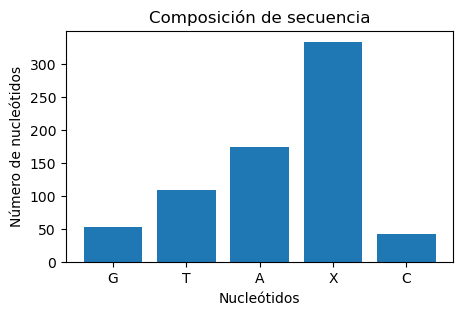

In [441]:
analisis_secuencia(p_clustal_consenso_brca2_11)

La secuencia tiene una longitud de 287 bases y está compuesta por: {'G': 16, 'X': 146, 'C': 17, 'T': 47, 'A': 61}

Las purinas conforman un 26.82926829268293%, mientras que las pirimidinas un 22.299651567944252

Presenta un porcentaje de GC del 23.404255319148938 %
Y el porcentaje de bases nucleotídicas ambiguas en la secuencia es del 50.87108013937282%

 No se puede realizar un análisis de correspondencia de aa dada la ambiguedad presente en los nucleótidos


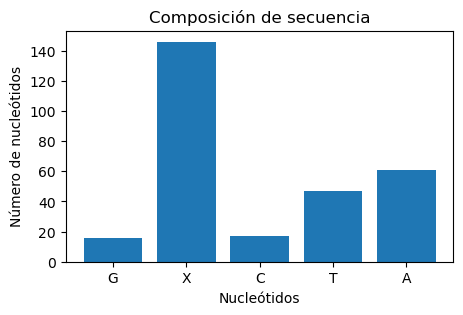

In [442]:
analisis_secuencia(c_clustal_consenso_brca2_11)

La secuencia tiene una longitud de 84 bases y está compuesta por: <function num_nucleotidos at 0x000002D80D124EE0>

Las purinas conforman un 65.47619047619048%, mientras que las pirimidinas un 34.523809523809526

Presenta un porcentaje de GC del 63.095238095238095 %

La traducción incluiría los siguientes aminoácidos: {'G': 3, 'R': 5, 'D': 1, 'T': 2, 'E': 5, 'N': 1, 'L': 2, 'K': 3, 'P': 3, 'H': 2, 'S': 1}


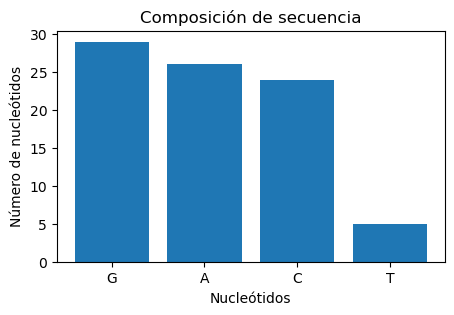

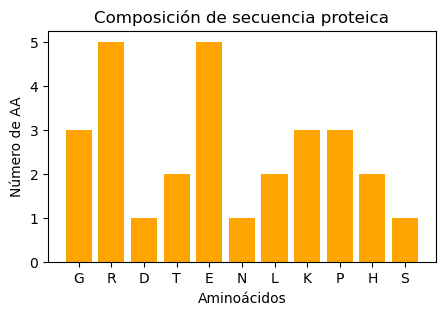

In [482]:
analisis_secuencia(c_clustal_consenso_tp53_8)

## Alineamiento pareado de secuencias

In [563]:
####HAY QUE VOLVER A COMENTARLO

Tal y como se ha ido realizando a lo largo de este notebook, para una primera comparación de secuencias se hará uso de un alinemiento. Pero para este apartado en concreto, se realizará un alineamiento pareado de secuencia control y secuencia patologica, ambas de conseso. De esta forma, realizaremos un análisis rápido aunque sencillo de los diferentes patrones que se puedan observar.


El alinemiento a realizar estará basado en el algoritmo propuesto por primera vez en 1970 por Saul Needleman y Christian Wunsch,conocido como algoritmo de Neddleman-Wunsch, basado en un alineamiento global. La razón por la cual realizamos un alineamiento global sobre uno local son las propiedades y relaciones que presentan nuestras secuencias a estudiar; unas secuencias a priori muy similares en toda su extensión, y tras nuestro filtrado, con longitudes similares.

## Comparación de secuencia consenso control - secuencia consenso patológica

En este análisis se podrá identificar aquellas mutacioens comunes que presenten las secuencias patológicas.

#### CLUSTAL

##### BRCA1 exon 5

Para el primer caso vemos el proceso de comparación de forma más detallada:

En primer lugar se imprimen las secuencias consenso ejemplo a comparar:

In [564]:
print(p_clustal_consenso_brca1_5)
print(len(p_clustal_consenso_brca1_5))

print(c_clustal_consenso_brca1_5)
print(len(c_clustal_consenso_brca1_5))

CTTTTGAGTATTCTTTCTACAAAAGGAAGTAAAATTAAATTGTTCTTTCTTTCTTTATAATTTATAGATTTTGCATGCTGAAACTTCTCAACCAGAAGAAAGGGCCTTCACAGTGTCCTTTATGTAAGAATGATATAACCAAAAGGTATATAATTTGGTAATGATGCTAGGTTGGAAGCAACCACAGTAGGAAAAAGTAGAAATTATTTAATAACATAGCGTTCCTATAAAACCATTCATCAGAAAAATTTATAAAAGAGTTTTTAGCACACAGTAAATTATTTCCAAAGTTATTTTCCTGAAAGTTTTATGGGACATCTGCCTTATACAGGTATTAGAAACTTACTGCCTTTCTCTAATGCAAXAAA
368
CTACTGTTGCTGCATCTTATTTTTATTTGTTTACATGTCTTTTCTTATTTTAGTGTCCTTAAAAGGTTGATAATCACTTGCTXAGTGTGTTTCTCAAACAATTTAATTTCAGGAGCCTACAAGAAAGTACGAGATTTAGTCAACTTGTTGAAGAGCTATTGAAAATCATTTGTGCTTTTCAGCTTGACACAGGTTTGGAGTGTAAGTGTTGAATATCCCAAGAATGACACTCAAGTGCTGTCCATGAAAACTCAGGAAGTTTGCACAATTACTTTCTATGACGTGGTGATAAGACCTTTTAGTCTAGGTTAATTTTAGTTCTGTATCTGTAATCTATTTTTAAAAAATTACTCCCACTGGTCTCACACCXCA
372


Con ello, se define el alineador con los parámetros escogidos. Estos parámetros con los que se construirá el alineador a utilizar, son cruciales a la hora de obtener unos u otros alineamientos, de forma que deben ser elegidos según la situación que al profesional le interese sumándole a que debe presentar un sentido biológico lógico.

In [565]:
from Bio import Align 

#se realiza primero la creación de un alineador con unas características definidas
#Defini
alineador_global=Align.PairwiseAligner(mode="global", mismatch_score=0,target_internal_open_gap_score=-5,target_internal_extend_gap_score=-1,query_internal_open_gap_score=-5,query_internal_extend_gap_score=-1)

alineamientos_globales=alineador_global.align(c_clustal_consenso_brca1_5,p_clustal_consenso_brca1_5)

Estado actual del alineador global con sus diferentes parámetros definidos:

In [566]:
print(alineador_global)

Pairwise sequence aligner with parameters
  wildcard: None
  match_score: 1.000000
  mismatch_score: 0.000000
  target_internal_open_gap_score: -5.000000
  target_internal_extend_gap_score: -1.000000
  target_left_open_gap_score: 0.000000
  target_left_extend_gap_score: 0.000000
  target_right_open_gap_score: 0.000000
  target_right_extend_gap_score: 0.000000
  query_internal_open_gap_score: -5.000000
  query_internal_extend_gap_score: -1.000000
  query_left_open_gap_score: 0.000000
  query_left_extend_gap_score: 0.000000
  query_right_open_gap_score: 0.000000
  query_right_extend_gap_score: 0.000000
  mode: global



Se imprime por pantalla la matriz de sustituciones, la cual indica la frecuencia de cada par de elementos que tienen lugar en el alineamiento de las dos secuencias; el propio alineamiento global según los parámetros establecidos con anterioridad, y, por último, su puntuación asociada.

In [567]:
alineamiento_global=next(alineamientos_globales)
print(alineamiento_global.substitutions)
print()
print(alineamiento_global)
print()
print(alineamiento_global.score)

     A    C    G    T   X
A 44.0 12.0 16.0 30.0 0.0
C 19.0 18.0  8.0 16.0 0.0
G 30.0  6.0  8.0 19.0 0.0
T 39.0 18.0 21.0 60.0 0.0
X  0.0  0.0  1.0  0.0 1.0


target            0 CTACTGTTGCTGCATCTTATTTTTATTTGTTTACATGTCTTTTCTTATTTTAGTGTCCTT
                  0 ------.|..||..|.||.|||.||.......|..|....||...|..||...|.|...|
query             0 ------CTTTTGAGTATTCTTTCTACAAAAGGAAGTAAAATTAAATTGTTCTTTCTTTCT

target           60 AAAAGGTTGATAATCACTTGCTXAGTGTGTTTCTCAAACA-ATTTAATTTCAGGAGCCTA
                 60 ..|...||.|||.....|...|........|||||||.||-|...||...|.....|...
query            54 TTATAATTTATAGATTTTGCATGCTGAAACTTCTCAACCAGAAGAAAGGGCCTTCACAGT

target          119 CAAGAAAGTACGAGATTTAGTCAACTTGTTGAAGAGCTATTGAAAATCATTTGTGCTTTT
                120 ........|...|||.|.|...|||.....|.......|||....|....|..|...||.
query           114 GTCCTTTATGTAAGAATGATATAACCAAAAGGTATATAATTTGGTAATGATGCTAGGTTG

target          179 CAGCTTGACACAGGTTTGGAGTGTAAGTGTTGAATATCCCAAGAATGACACTCAAGTGCT
                180 .|......|

Calculamos el número de identidades, mismatches y gaps presenta nuestro alineamiento global definido:

In [568]:
cuentas=alineamiento_global.counts()
print(cuentas)
print(f"El alineamiento tiene {cuentas.gaps} huecos, {cuentas.identities} identidades, {cuentas.mismatches} mismatches")

AlignmentCounts(gaps=8, identities=131, mismatches=235)
El alineamiento tiene 8 huecos, 131 identidades, 235 mismatches


Se realiza la creación de funciones para una mayor brevedad del código:

In [569]:
def encontrar_mejor_alineamiento(alineamientos):
    
    mejor_puntuacion=alineamientos[0].score
    mejor_alineamiento=alineamientos[0]
    
    for alineamiento in alineamientos:
        
        if alineamiento.score > mejor_puntuacion:
            
            mejor_puntuacion = alineamiento.score
            
            mejor_alineamiento = alineamiento
            
    return mejor_alineamiento


def alineamiento(secuencia_target,secuencia_query,modo,match_score=1,mismatch_score=0):
    
    if modo=="global":
        alineador_global=Align.PairwiseAligner(mode="global", match_score=match_score,mismatch_score=mismatch_score,target_internal_open_gap_score=-10,target_internal_extend_gap_score=-1,query_internal_open_gap_score=-10,query_internal_extend_gap_score=-1)
    
        alineamientos_globales=alineador_global.align(secuencia_target,secuencia_query)
                
        alineamiento_global=encontrar_mejor_alineamiento(alineamientos_globales) 
                    
        return alineamiento_global
    
    
    elif modo=="local":
        alineador_local=Align.PairwiseAligner(mode="local",match_score=match_score, mismatch_score=mismatch_score,target_internal_open_gap_score=-5,target_internal_extend_gap_score=-0.5,query_internal_open_gap_score=-5,query_internal_extend_gap_score=-0.5)
    
        alineamientos_locales=alineador_local.align(secuencia_target,secuencia_query)
                
        alineamiento_local=encontrar_mejor_alineamiento(alineamientos_locales) 
                            
        return alineamiento_local
    
    else:
        print("Introduzca un modo de alineamiento válido(global o local)")
        
        
def comparacion_secuencias_consenso(sec_consenso_control,sec_consenso_patologica,nombre_gen,match_score=1,missmatch_score=0):
        
    gen=nombre_gen.split(" ")[0].upper()
    
    exon=nombre_gen.split(" ")[1]
    
    alineamiento_global=alineamiento(sec_consenso_control,sec_consenso_patologica,modo="global",match_score=match_score,mismatch_score=missmatch_score)
    
    alineamiento_local=alineamiento(sec_consenso_control,sec_consenso_patologica,modo="local",match_score=match_score,mismatch_score=missmatch_score)
    
    print(f"----------------------------------ALINEAMIENTO GLOBAL {gen} EXON {exon}-------------------------------")
    print(alineamiento_global)
    print()
    print(f"El alineamiento global tiene {alineamiento_global.counts().gaps} huecos, {alineamiento_global.counts().identities} identidades, {alineamiento_global.counts().mismatches} mismatches")
    print()
    print(f"Presenta una puntuación de {alineamiento_global.score}")
    print("\n\n")
    print(f"----------------------------------ALINEAMIENTO LOCAL {gen} EXON {exon}-------------------------------")
    print(alineamiento_local)
    print()
    print(f"El alineamiento local tiene {alineamiento_local.counts().gaps} huecos, {alineamiento_local.counts().identities} identidades, {alineamiento_local.counts().mismatches} mismatches")
    print()
    print(f"Presenta una puntuación de {alineamiento_local.score}")
    print("\n\n\n")
    mostrar_dotplot(sec_consenso_control,sec_consenso_patologica,f"Control {gen} exon {exon}",f"Patológica {gen} exon {exon}")
    print()
    print(f"La diferencia de puntuaciones entre los distintos algoritmos es de {abs(alineamiento_global.score-alineamiento_local.score)}")

A su vez, se incluye la creación adicional de una función que realiza una representación visual del alineamiento, para poder obtener, en caso de que halla, información adicional:

In [570]:
import numpy as np
from matplotlib import pyplot, colors

def crear_matriz(nfilas,ncolumnas):
    return np.zeros((nfilas,ncolumnas))

def crear_dotplot(secuencia1,secuencia2):
    matriz_dotplot=crear_matriz(len(secuencia1),len(secuencia2))
    for i in range(len(secuencia1)):
        for j in range(len(secuencia2)):
            if secuencia1[i]==secuencia2[j]:
                matriz_dotplot[i,j]=1
    return matriz_dotplot

def mostrar_dotplot(secuencia1,secuencia2,id1="Secuencia 1 desconocida",id2="Secuencia 2 desconocida"):
    pyplot.figure(figsize=(8,6))
    pyplot.ylabel(id1 + " (longitud:%i)" % len(secuencia1),size= 8)
    pyplot.xlabel(id2 + " (longitud:%i)" % len(secuencia2),size = 8)
    pyplot.title("Gráfico Dot plot",size=10)
    datos=crear_dotplot(secuencia1,secuencia2)
    pyplot.imshow(datos,interpolation='none',cmap="Greys")
    pyplot.show()

El conjunto de las funciones anteriormente creadas proporcionan un análisis específico para las secuencias consenso a comparar:

----------------------------------ALINEAMIENTO GLOBAL BRCA1 EXON 5-------------------------------
target            0 CTACTGTTGCTGCATCTTATTTTTATTTGTTTACATGTCTTTTCTTATTTTAGTGTCCTT
                  0 --..|.|...|.....||.|....|......||.|..|...||.||.|||...|.|...|
query             0 --CTTTTGAGTATTCTTTCTACAAAAGGAAGTAAAATTAAATTGTTCTTTCTTTCTTTAT

target           60 AAAAGGTTGATAATCACTTGCTXAGTGTGTTTCTCAAACAATTTAATTTCAGGAGCCTAC
                 60 ||....|.|||..|...|.....|...|.|....||.|..|.......|....||..|.|
query            58 AATTTATAGATTTTGCATGCTGAAACTTCTCAACCAGAAGAAAGGGCCTTCACAGTGTCC

target          120 AAGAAAGTACGAGATTTAGTCAACTTGTTGAAGAGCTATTGAAAATCATTTGTGCTTTTC
                120 ...|....|..|...|....|.|...|.|..|.|..|....||......|.|........
query           118 TTTATGTAAGAATGATATAACCAAAAGGTATATAATTTGGTAATGATGCTAGGTTGGAAG

target          180 AGCTTGACACAGGTTTGGAGTGTAAGTGTTGAATATCCCAAGAATGACACTCAAGTGCTG
                180 ..........|||........|.||.|.||.||||.|..|....|...|...||....|.
query   

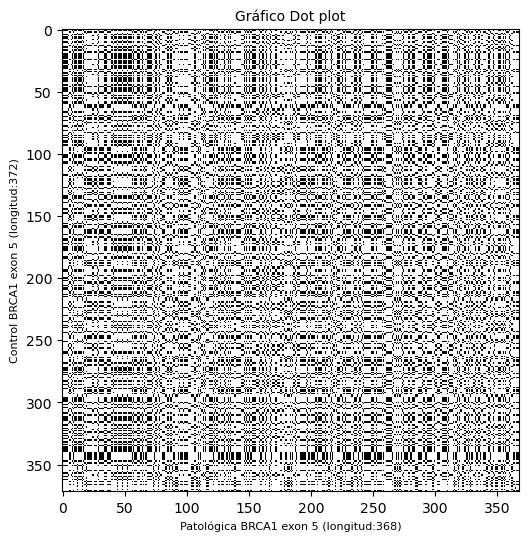


La diferencia de puntuaciones entre los distintos algoritmos es de 5.0


In [571]:
comparacion_secuencias_consenso(c_clustal_consenso_brca1_5,p_clustal_consenso_brca1_5,"brca1 5")

##### BRCA2

Para el caso de BRCA2 podemos llamar de nuevo a la función creada, para poder así, analizar diferencias y similitudes entres los casos control y patológicos.

In [572]:
#Utilizarlo como ejemplo
align=AlignIO.read("Resultados\Alineamiento secuencias patológicas\Resultados alineamiento clustal\clustal algn BRCA2 exon11.afa","fasta")
a=align[0].seq
a

Seq('------------------------------------------------------...---')

----------------------------------ALINEAMIENTO GLOBAL BRCA2 EXON 11-------------------------------
target            0 ------------------------------------------------------------
                  0 ------------------------------------------------------------
query             0 GTGAXXXXCAXTXCAACCXXXAAAAATAAAAATGXAGXXAXXAAAXTXXXXATXXXTXAX

target           60 ------------------------------------------------------------
                 60 ------------------------------------------------------------
query            60 AXXAXTXXXXXXXXXXXXAXAGXXXXXXCTTCAXXXXXAAXXXXXAAXAXXXXXXAXXGX

target          120 ------------------------------------------------------------
                120 ------------------------------------------------------------
query           120 XXAXXXXXXXXXTXTTTCXXATGXXXCXXTXAAAAAAGTGAAAGAGAXAXTXACTXXCAX

target          180 ---------------------------------------------------CAAAAGGCA
                180 ---------------------------------------------------|||||...|
query  

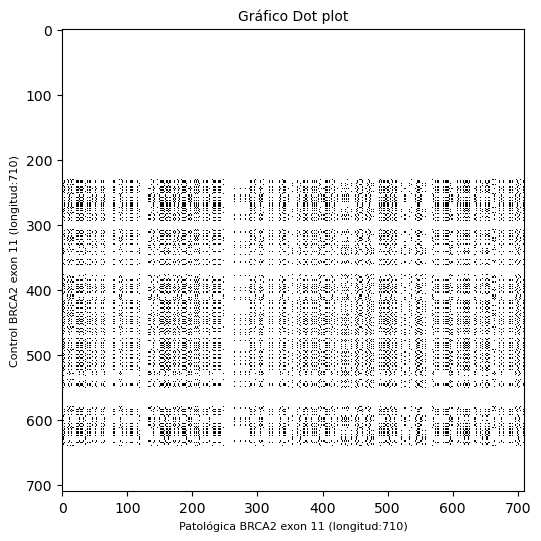


La diferencia de puntuaciones entre los distintos algoritmos es de 0.0


In [573]:
#EJEMPLO 
comparacion_secuencias_consenso(a,p_clustal_consenso_brca2_11,"brca2 11")

----------------------------------ALINEAMIENTO GLOBAL BRCA2 EXON 11-------------------------------
target            0 -----------------------------------------------------GXGCXXX
                  0 -----------------------------------------------------.|..|.|
query             0 GTGAXXXXCAXTXCAACCXXXAAAAATAAAAATGXAGXXAXXAAAXTXXXXATXXXTXAX

target            7 XXXXXTXXTXATTXXAXAAAXXXTAXTXTATGTXXXTXCXXXAGCTAXXCAAAXXXXTXT
                 60 .||.||||.|...||.|.|...|..|.|..|..|||.|..||....||.....||.|...
query            60 AXXAXTXXXXXXXXXXXXAXAGXXXXXXCTTCAXXXXXAAXXXXXAAXAXXXXXXAXXGX

target           67 XAXGCXGXATATAXAXAXXXXTCTAXTTXAXXATATXAXTXAGGAAXTXXXCTTGAXTXT
                120 |....|.|.....|....||.|...|..|.|.|.|......|.||....|......|...
query           120 XXAXXXXXXXXXTXTTTCXXATGXXXCXXTXAAAAAAGTGAAAGAGAXAXTXACTXXCAX

target          127 XCTCAGXXTAXAXAXCCAXXXXXCATATTGCAXAAXXAXXXXTTXXAXGXXCAAXXAXAC
                180 ...|||...|..|....|.|||....|....||.||..|||...||.|.|.|||...|..
query  

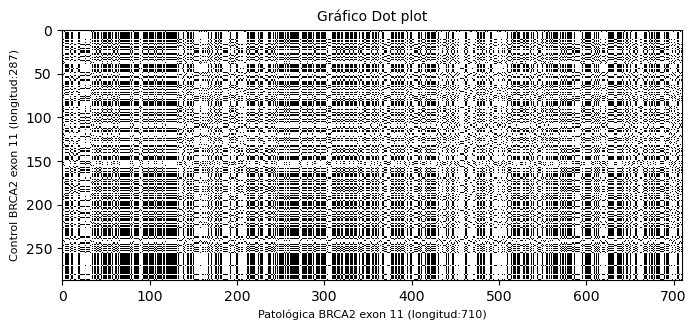


La diferencia de puntuaciones entre los distintos algoritmos es de 5.0


In [574]:
comparacion_secuencias_consenso(c_clustal_consenso_brca2_11,p_clustal_consenso_brca2_11,"brca2 11")

##### TP53 exon 5

En la comparación del primer exón del gen TP53 se obtiene el siguiente análisis:

----------------------------------ALINEAMIENTO GLOBAL TP53 EXON 5-------------------------------
target            0 ------------------------------------------------------------
                  0 ------------------------------------------------------------
query             0 GTGAXXXXCAXTXCAACCXXXAAAAATAAAAATGXAGXXAXXAAAXTXXXXATXXXTXAX

target            0 ------------------------------------------------------------
                 60 ------------------------------------------------------------
query            60 AXXAXTXXXXXXXXXXXXAXAGXXXXXXCTTCAXXXXXAAXXXXXAAXAXXXXXXAXXGX

target            0 ------------------------------------------------------------
                120 ------------------------------------------------------------
query           120 XXAXXXXXXXXXTXTTTCXXATGXXXCXXTXAAAAAAGTGAAAGAGAXAXTXACTXXCAX

target            0 ------------------------------------------------------------
                180 ------------------------------------------------------------
query    

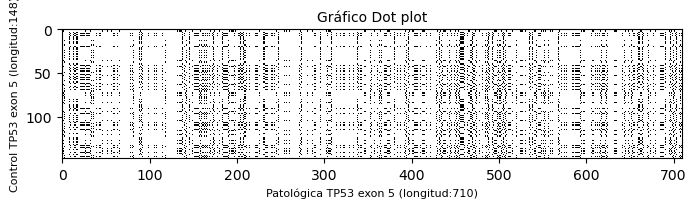


La diferencia de puntuaciones entre los distintos algoritmos es de 0.0


In [575]:
comparacion_secuencias_consenso(c_clustal_consenso_tp53_5,p_clustal_consenso_tp53_5,"tp53 5")

##### TP53 exon 8

En último lugar se encuentra la comparáción con el exón 8 del gen TP53

----------------------------------ALINEAMIENTO GLOBAL TP53 EXON 8-------------------------------
target            0 ------------------------------------------------------------
                  0 ------------------------------------------------------------
query             0 GGAGACAGGGTCAGTTATGCCTCAGATTCACTTTTATCACCTTTCCTTGCCTCTTTCCTA

target            0 ------------------GGGAGAGACCGGCGCACAGAGGAAGAGAATCTCCGCAAGAAA
                 60 ------------------.|.......|..|...||.||.|..|....||........||
query            60 GCACTGCCCAACAACACCAGCTCCTCTCCCCAGCCAAAGAAGAAACCACTGGATGGAGAA

target           42 GGGGAGCCTCACCACGAGCTGCCCCCAGGGAGCACTAAGCGA------------------
                120 .......|.|..||.|..||....|..||||.|.||.|.|.|------------------
query           120 TATTTCACCCTTCAGGTACTAAGTCTTGGGACCTCTTATCAAGTGGAAAGTTTCCAGTCT

target           84 -----------------  84
                180 ----------------- 197
query           180 AACACTCAAAATGCCGA 197


El alineamiento global tiene 113 huecos, 31

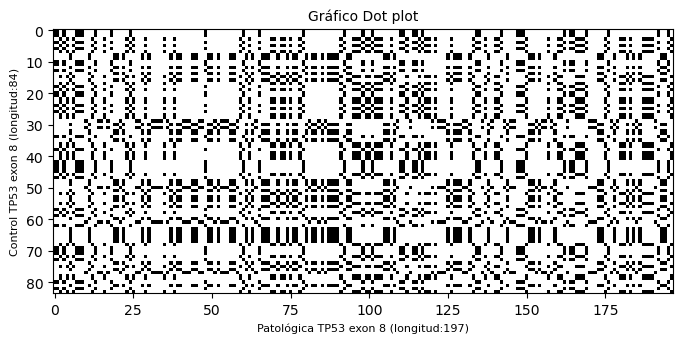


La diferencia de puntuaciones entre los distintos algoritmos es de 0.0


In [576]:
comparacion_secuencias_consenso(c_clustal_consenso_tp53_8,p_clustal_consenso_tp53_8,"tp53 8")

#### MUSCLE

##### BRCA1

----------------------------------ALINEAMIENTO GLOBAL BRCA1 EXON 5-------------------------------
target            0 ---------------------CTACTGTTGCTGCATCTTATTTTTATTTGTTTACATGTC
                  0 ---------------------..|..............|...||..||..||........
query             0 XTTTTGAGTATTCTTTCTACAAAAGGAAGTAAATTAAATTAGTTCTTTCTTTCTTTATAA

target           39 TTTTCTTATTTTAGTGTCCTTAAAAGGTTGATAATCACTTGCTXAGTGTGTTTCTCAAAC
                 60 .|||.|...|||.|..|.||.|||||||||||||||||||||||||||||.|||||||.|
query            60 CTTTATAGATTTTGCATGCTGAAAAGGTTGATAATCACTTGCTXAGTGTGCTTCTCAACC

target           99 AATTTAA-------TTTCAGGAGCCTACAAGAAAGTACGAGATTTAGTCAACTTGTTGAA
                120 |....||-------|..|||...|||..|.|.|||.|.||.||..||.|||...||..|.
query           120 AGAAGAAAGGGCCTTCACAGTGTCCTTTATGTAAGAATGATATAAAGCCAAAAGGTATAT

target          152 GAGCTATTGAAAATCATTTGTGCTTTTCAGCTTGACACAGGTTTGGAGTGT---AAGTGT
                180 .|||..|||..|||.||....|.||...|||..|.|||||......|..||---||.|.|
query   

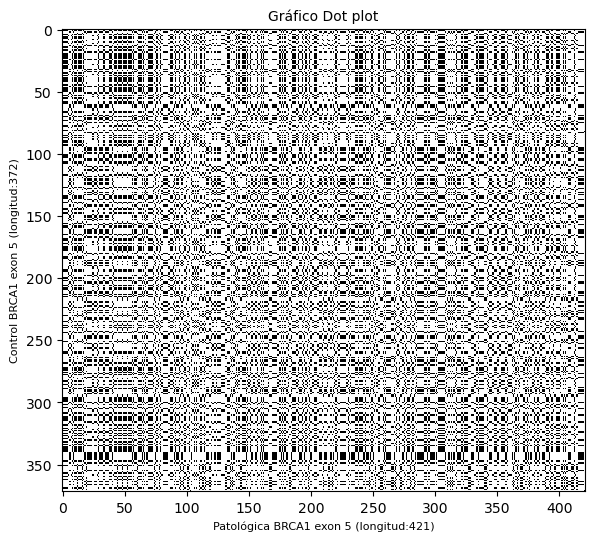


La diferencia de puntuaciones entre los distintos algoritmos es de 32.0


In [577]:
comparacion_secuencias_consenso(c_muscle_consenso_brca1_5,p_muscle_consenso_brca1_5,"brca1 5")

##### BRCA2

----------------------------------ALINEAMIENTO GLOBAL BRCA2 EXON 11-------------------------------
target            0 ------------------------------------------------------------
                  0 ------------------------------------------------------------
query             0 CXAXXAXAXCAXXCAXAAXTGTGCCAAACGAAAATTATGGCAGGTTGTTACGAGGCATTG

target            0 ------------------------------------------------------------
                 60 ------------------------------------------------------------
query            60 GATGATTCAGAGGATATTCTTCATAACTCTAGATAATGATGAATGTAGCACGCATTCXXA

target            0 -XXXXTXXXXXXXTAAXTXXXCXCXTAGCCAAGXXXCAXXXXTXAXAGXTXTTXCTXXXX
                120 -..||..||.|...|.||........|...||.||||.|.||........|.|.|..|||
query           120 XAAXXXTXXTXCTGACXTTCAGAGTGAAGAAATXXXCXXTXXXTXAXAAXXXTACGAXXX

target           59 TTCTTGXXGAGGXXXXXXAAXAXXCXGXAAAXCXXTXXXXAXXTAAAXXXXXXXXTAGXT
                180 |.....||.|.|||.|||..|..|.....|.|.||.||.|....||...||....||...
query  

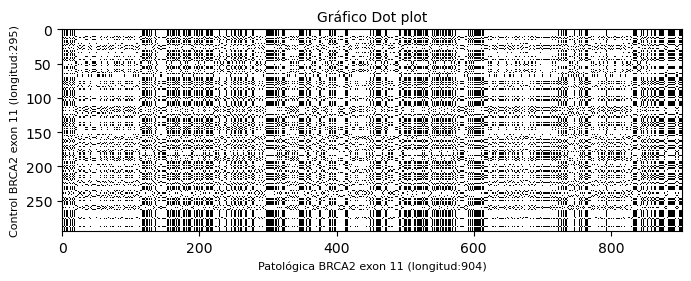


La diferencia de puntuaciones entre los distintos algoritmos es de 2.5


In [578]:
comparacion_secuencias_consenso(c_muscle_consenso_brca2_11,p_muscle_consenso_brca2_11,"brca2 11")

##### TP53 exon 5

----------------------------------ALINEAMIENTO GLOBAL TP53 EXON 5-------------------------------
target            0 --------GATTCCACACCCCCGCCCGGCACCCGCGTCCGCGCCATGGCCATCTACAAGC
                  0 --------...||......|..||||..|..|.||.||....||..|...|...|.|...
query             0 TCACTGATTGCTCTTAGGTCTGGCCCCTCCTCAGCATCTTATCCGAGTGGAAGGAAATTT

target           52 AGTCACAGCACATGACGGAGGTTGTGAGGCGCTGCCCCCACCATGAGCGCTGCTCAGATA
                 60 .......|...||...|..|...|..|..|..|.|..|........|.|.|||.|....|
query            60 GCGTGTGGAGTATTTGGATGACAGAAACACTTTTCGACATAGTGTGGTGGTGCCCTATGA

target          112 GCGATGGTCTGGCCCCTCCTCAGCATCTTATCCGAG----------------- 148
                120 ||........|.|...|...||.|........|..|----------------- 173
query           120 GCCGCCTGAGGTCTGGTTTGCAACTGGGGTCTCTGGGAGGGAGGGGTTAAGGG 173


El alineamiento global tiene 25 huecos, 47 identidades, 101 mismatches

Presenta una puntuación de 47.0



----------------------------------ALINEAMIENTO LOCAL TP53 EXON 5--------

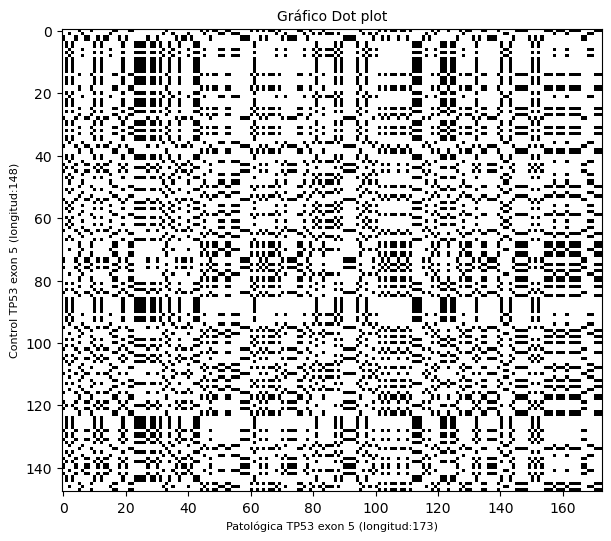


La diferencia de puntuaciones entre los distintos algoritmos es de 0.0


In [579]:
comparacion_secuencias_consenso(c_muscle_consenso_tp53_5,p_muscle_consenso_tp53_5,"tp53 5")

##### TP53 exon 8

----------------------------------ALINEAMIENTO GLOBAL TP53 EXON 8-------------------------------
target            0 ------------------------------------------------------------
                  0 ------------------------------------------------------------
query             0 GGAGACAGGGTCAGTTATGCCTCAGATTCACTTTTATCACCTTTCCTTGCCTCTTTCCTA

target            0 ------------------GGGAGAGACCGGCGCACAGAGGAAGAGAATCTCCGCAAGAAA
                 60 ------------------.|.......|..|...||.||.|..|....||........||
query            60 GCACTGCCCAACAACACCAGCTCCTCTCCCCAGCCAAAGAAGAAACCACTGGATGGAGAA

target           42 GGGGAGCCTCACCACGAGCTGCCCCCAGGGAGCACTAAGCGA------------------
                120 .......|.|..||.|..||....|..||||.|.||.|.|.|------------------
query           120 TATTTCACCCTTCAGGTACTAAGTCTTGGGACCTCTTATCAAGTGGAAAGTTTCCAGTCT

target           84 -----------------  84
                180 ----------------- 197
query           180 AACACTCAAAATGCCGA 197


El alineamiento global tiene 113 huecos, 31

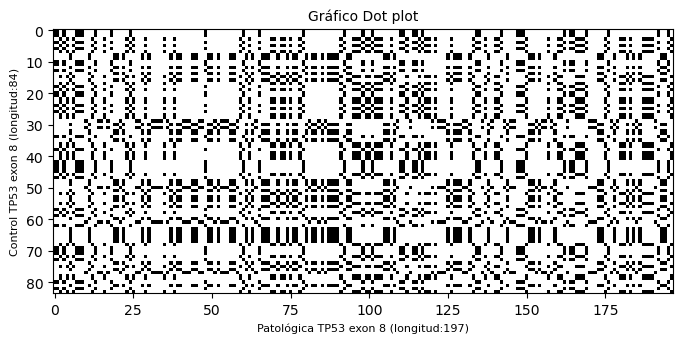


La diferencia de puntuaciones entre los distintos algoritmos es de 0.0


In [580]:
comparacion_secuencias_consenso(c_muscle_consenso_tp53_8,p_muscle_consenso_tp53_8,"tp53 8")

## Matrices de sustituciones para alineamiento pareado

In [ ]:
### EJEMPLO BRCA2 CON DICCIONARIOS Y EL RESTO CON LITERATURA(PARA PIK3CA NO HAY CONSENSO DE CONTROL Y PARA EL RESTO EN 
#GNOMAD NO HAY DATOS)(AQUÍ PODREMOS OBSERVAR MUTACIONES GENERALES)

In [456]:
import numpy as np 

def hallar_matriz_puntuaciones(alineamiento):
    #ahora para hallar la matriz de probabilidad:
    frecuencias_observadas= alineamiento.substitutions/alineamiento.substitutions.sum()
    
    #se actualizan las frecuencias observadas y la hacemos simetrica:
    #tendríamos con ello la probabilidad de cada sustitución
    frecuencias_observadas= (frecuencias_observadas+frecuencias_observadas.transpose())/2.0
    
    #también se calcularía la probabilidad de encontrar un nucleótido en dicha secuencia
    probabilidad_nucleotidos=frecuencias_observadas.sum(0)
    
    #producto cartesiano
    frecuencias_esperadas= probabilidad_nucleotidos[:,None]*probabilidad_nucleotidos[None,:]
    
    #evaluamos las frecuencias con los valores teóricos que deberían presentar por azar
    oddsratios = frecuencias_observadas / frecuencias_esperadas
    
    #finalmente se calcula la matriz de puntuación
    matriz_puntuacion = np.log2(oddsratios)
    
    return matriz_puntuacion


def calcular_matrices_pareado(alineamiento_pareado):
    
    matriz_puntuacion = hallar_matriz_puntuaciones(alineamiento_pareado)
    
    print("Matriz de sustitución del alineamiento pareado: \n")
    print(alineamiento_pareado.substitutions)
    print()
    print()
    print("Matriz de puntuación del alineamiento pareado: \n")
    print(matriz_puntuacion)
    
    return alineamiento_pareado.substitutions,matriz_puntuacion

In [484]:
def obtener_cadena_coincidencias(alineamiento):
    cadena_coincidencias=""
    #control
    secuencia_target=alineamiento[0]
    #patologica
    secuencia_query=alineamiento[1]
    for n in range(len(secuencia_target)):  
        if secuencia_target[n]==secuencia_query[n]:
            cadena_coincidencias=cadena_coincidencias+"|"
        elif (secuencia_target[n]!= '-' and secuencia_query[n]=='-') or (secuencia_target[n]== '-' and secuencia_query[n]!='-') or (secuencia_target[n]== '-' and secuencia_query[n]!='-'):
            cadena_coincidencias=cadena_coincidencias+"-"
        else:
            cadena_coincidencias=cadena_coincidencias+"."
    return cadena_coincidencias
                
    
def detectar_sustituciones(alineamiento):
    dic_sustituciones={}
    #a partir de la matriz de frecuencias generado con el alineamiento pareado
    matriz_sustitucion=alineamiento.substitutions
    matriz_puntuacion=hallar_matriz_puntuaciones(alineamiento)
    alfabeto=matriz_sustitucion.alphabet
    for i in range(0,len(matriz_sustitucion)):
        for j in range(0,len(matriz_sustitucion)):
            if i!=j:
                if matriz_puntuacion[i][j]>0 and matriz_sustitucion[i][j]!=0:
                    clave=alfabeto[i]+">"+alfabeto[j]
                    dic_sustituciones[clave]= {"frecuencia":matriz_sustitucion[i][j],"frecuencia aleatoria":"común"}
                    
                elif matriz_puntuacion[i][j]<0 and matriz_sustitucion[i][j]!=0:
                    clave=alfabeto[i]+">"+alfabeto[j]
                    dic_sustituciones[clave]= {"frecuencia":matriz_sustitucion[i][j],"frecuencia aleatoria":"inusual"}
                    
                else:
                    if matriz_sustitucion[i][j]!=0:
                        clave=alfabeto[i]+">"+alfabeto[j]
                        dic_sustituciones[clave]= {"frecuencia":matriz_sustitucion[i][j],"frecuencia aleatoria":"neutra"}

    return dic_sustituciones
    
#LA DETECCIÓN DE INDELS ES ESCLUSIVA DE ALINEAMIENTO PAREADO
def detectar_indels(alineamiento):
    #a partir del propio alineamiento
    dic_indels={'del':{'frecuencia':0,'delecciones':[],'posiciones en secuencia':[]},'ins':{'frecuencia':0,'inserciones':[],'posiciones en secuencia':[]}}
    #bandera para limitar deteccion de delecciones
    bandera=0
    #control
    secuencia_target=alineamiento[0]
    #patologica
    secuencia_query=alineamiento[1]
    #detectar del
    for n in range(len(secuencia_target)):
        if secuencia_query[n]!='-':
            bandera=bandera+1
        if bandera !=0:
            if secuencia_target[n]!= '-' and secuencia_query[n]=='-':
                dic_indels['del']['frecuencia']= dic_indels['del']['frecuencia']+1
                dic_indels['del']['delecciones'].append('del'+ str(secuencia_target[n]))
                dic_indels['del']['posiciones en secuencia'].append(n+1)
    
    #detectar ins (or (secuencia_target[n]!= '-' and secuencia_query=='-'))
    bandera=0
    cadena_coincidencias=obtener_cadena_coincidencias(alineamiento)
    for n in range(10,len(secuencia_target)-10):     
        mis_10_anteriores=cadena_coincidencias[n-10:n].count('.')
        mis_10_posteriores=cadena_coincidencias[n:n+10].count('.')
        if secuencia_query[n]!='-':
            bandera=bandera+1
        if bandera !=0:
            if mis_10_anteriores>mis_10_posteriores*3:
                dic_indels['ins']['frecuencia']=dic_indels['ins']['frecuencia']+1
                dic_indels['ins']['inserciones'].append('ins'+ str(secuencia_target[n]))
                dic_indels['ins']['posiciones en secuencia'].append(str((n+1)-10)+"_"+str(n+1))
            if mis_10_anteriores*3<mis_10_posteriores:
                dic_indels['ins']['frecuencia']=dic_indels['ins']['frecuencia']+1
                dic_indels['ins']['inserciones'].append('ins'+ str(secuencia_target[n]))
                dic_indels['ins']['posiciones en secuencia'].append(str(n+1)+"_"+str((n+1)+10))
            
    #prints con informacion general
    print(f"El alineamiento presenta un total de {dic_indels['del']['frecuencia']} posibles delecciones y un total de {dic_indels['ins']['frecuencia']} posibles inserciones")
    print(f"Las posibles posiciones de las delecciones son: {dic_indels['del']['posiciones en secuencia']}")
    print(f"Las posibles posiciones de las inserciones son: {dic_indels['ins']['posiciones en secuencia']}")
    return dic_indels

In [485]:
def crear_dic_sust_frec(dic_sustituciones):
    dic_sust_frec={}
    for clave in list(dic_sustituciones):
        dic_sust_frec[clave]= dic_sustituciones[clave]['frecuencia']
    return dic_sust_frec

def hallar_mayor_frec(dic_sustituciones):
    #NO TIENE EN CUENTA LOS NUCLEÓTIDOS AMBIGUOS
    contador=0
    dic_sust_frec=crear_dic_sust_frec(dic_sustituciones)
    lista_valores=list(dic_sust_frec.values())
    lista_valores.sort(reverse=True)
    for valor in lista_valores:
        for clave in list(dic_sust_frec):
            if dic_sust_frec[clave]==valor and 'X' not in clave:
                return [clave,dic_sust_frec[clave]]


In [486]:
#FUNCIÓN EN CASO DE PRESENTAR UN DICCIONARIO DE VARIANTES ATRAVÉS DE GNOMAD
from collections import Counter

def analizar_sustituciones(dic_variantes,dic_sustituciones):
    sust_patologicas=[]
    sust_benignas=[]
    for sustitucion in list(dic_sustituciones):
        if 'X' not in sustitucion:
            if dic_variantes[sustitucion]['frecuencia maligna']>dic_variantes[sustitucion]['frecuencia benigna']:
                sust_patologicas.append(sustitucion)
            else:
                sust_benignas.append(sustitucion)
    mutacion_frecuente=hallar_mayor_frec(dic_sustituciones)[0]
    frecuencia_mutacion_frecuente=hallar_mayor_frec(dic_sustituciones)[1]
    print(f'La sustitución más habitual presente en el alineamiento es {mutacion_frecuente} con una frecuencia de {frecuencia_mutacion_frecuente}')
    
    if mutacion_frecuente in sust_patologicas:
        print(f"Una sustitución maligna que en la mayoría de los casos provoca un {Counter(dic_variantes[mutacion_frecuente]['Efecto en mutacion']).most_common(1)[0][0]}")
    else:
        print(f"Una sustitución benigna que en la mayoría de los casos provoca un {Counter(dic_variantes[mutacion_frecuente]['Efecto en mutacion']).most_common(1)[0][0]}")

    print(f'Sustituciones patológicas en el alineamiento: {sust_patologicas}')
    print(f'Sustituciones benignas en el alineamiento: {sust_benignas}')

In [487]:
print(c_clustal_consenso_brca2_11)
print()
print(p_clustal_consenso_brca2_11)

GXGCXXXXXXXXTXXTXATTXXAXAAAXXXTAXTXTATGTXXXTXCXXXAGCTAXXCAAAXXXXTXTXAXGCXGXATATAXAXAXXXXTCTAXTTXAXXATATXAXTXAGGAAXTXXXCTTGAXTXTXCTCAGXXTAXAXAXCCAXXXXXCATATTGCAXAAXXAXXXXTTXXAXGXXCAAXXAXACXXGXTXXTXAXXXXXAAXXTCXAATXTXAXXXATGXAXXTXXXXXXXXAXAAXCTGXAAXTXAXGAXATXXXXXXXXXXXXXXTXXXXTXXXXAXXTXXA

GTGAXXXXCAXTXCAACCXXXAAAAATAAAAATGXAGXXAXXAAAXTXXXXATXXXTXAXAXXAXTXXXXXXXXXXXXAXAGXXXXXXCTTCAXXXXXAAXXXXXAAXAXXXXXXAXXGXXXAXXXXXXXXXTXTTTCXXATGXXXCXXTXAAAAAAGTGAAAGAGAXAXTXACTXXCAXTXXCAGAAAAGTXTTTTATXXXAACAACGAGAXXAXAXXXXAAAXXTXXXCCAAAAXXXAXAXAXTXCAXXXXXTXXTXXTXXXTXXXXXXAXTCXXXXXXTXXXXTTXAAXXXXACXXXXXTXATTTCXXXXXAXXXAXXXAAXXXXXAXXXAXTXXCAXAAGXXTTXXXXXGAXXTXXXAXGTGAXXAAATTTTAXXXCXTXAXXAXXAXATGXCTXXXTTAAAGAXXAXTTCTXAXXXATXXXXXGXTXCTGATCTTXAXGTXAXXATGAATGCCCCAXXXATTGGTCAATGXXGTXXAXXGXAGCAXXCAATTTGAAGGTACAGXTXAAAXTXXXXGXXXGTTTXXTXGXXCAXCXXTTGXAAAATXTGTXXAGXTXTXXXXXXCTXXAXXAXAXAXXXXAAXAAAAAAGTGXTTXXXXXXXATTXAAXAXATGAAAATGAXXXXXXXTTTAXXXXXAXXGTXXTAGXGTAAXXXACCTTCAXXXXAGXTXXXAXTXXXXXAAAAXACXXXTCTAAGTACXXXAGA


Algunas secuencias presentan tantas variantes teóricas que el propio paquete de biopython no puede determinar para una posicion específica un nucleótido consenso del conjunto de secuencias en el alineamiento multiple realizado. Por ello se acudirá a la página web del visualizador de MSA en NCBI, donde presenta una secuencia consenso con una sintaxis propia para determinar las los nucleótdos que tendrían lugar en una posición dada.

Para este caso:

In [488]:
c_clustal_consensoNCBI_brca2_11=SeqIO.read("Resultados/Secuencias consenso/NCBI/Control/c_clustal_consensoNCBI_brca2_11.aln","fasta")
print(c_clustal_consensoNCBI_brca2_11.seq)
p_clustal_consensoNCBI_brca2_11=SeqIO.read("Resultados/Secuencias consenso/NCBI/Patológicas/p_clustal_consensoNCBI_brca2_11.aln","fasta")
print(p_clustal_consensoNCBI_brca2_11.seq)

-RGCWWYYMWWSTGCTNATTNAANAAAMNNTARTNT----NTCTACWRMAGCTANNCAAAANANTGTGANGCNGNATATANANAWSWYTCTANTTNANNATATNANTNAGGAAATCANCTTGAWTNTR-----KNTANANANCCAGNATA---------GAARWAWNNWTTWNAWGWNCAARWANACNAGNTNNTNANNNNNAAKWTCMAATSTNARNNATGSAAATNNNTACNNANAARCTGNAANTNANGANATTARTGAATGCCAACTNGTNTKACNAGNTAR-
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------AAKRMAGAWATTRCAGRNMKTTMTAYTRYATTNGAWGAWTCARRRRRTNWKYTTGAAWWYM-C----------TCWGTWWASRAAGCMAAGYT--ACRWA-TYNCASAAGRKTTTWGMTGASRTYWRARGTGAWRA-------SWRCMTRAMMAMMAKATGWCTNNMTTAAAGAMMAYTTCTRARRWATSMWNWGATKCTGATCTTSAWGTMANAATGAATGCCCCAWMRATTGGTC----WRGTNKAMNGNAGCAWNCAATTTGAAGGT-CAGWTSAAAWTRANYGKRNGTTTKCTRGNWCARCWRTTGWAAAATS----------------------------AMYRKAASAA--AAGTGYTTCYNGW-TATTNAASANATGAAAATGAARKSGGRTTTARRR-----------------------------------------------------------------------


In [489]:
alineamientos=alineador_global.align(c_clustal_consensoNCBI_brca2_11,p_clustal_consensoNCBI_brca2_11)
print(encontrar_mejor_alineamiento(alineamientos))

NCBI_C_C_         0 ------------------------------------------------------------
                  0 ||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
NCBI_P_C_         0 ------------------------------------------------------------

NCBI_C_C_         0 ------------------------------------------------------------
                 60 ||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
NCBI_P_C_        60 ------------------------------------------------------------

NCBI_C_C_         0 ------------------------------------------------------------
                120 ||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
NCBI_P_C_       120 ------------------------------------------------------------

NCBI_C_C_         0 ------------------------------------------------------------
                180 ||||||||||||||||||||||||||||||||||||||||||||||||||||||------
NCBI_P_C_       180 ------------------------------------------------------AAKRMA

NCBI_C_C_         0 ----

**BRCA1 exon 5**

In [536]:
import pandas as pd

def analisis_pareado_matrices(secuencia_control,secuencia_patologica,modo='global',match_score=1,mismatch_score=0):
    print(f"\n -------------------------------ALINEAMIENTO {modo.upper()}-------------------------------\n")
    alineamiento_pareado=alineamiento(secuencia_control,secuencia_patologica,modo=modo,match_score=match_score,mismatch_score=match_score)
    print(f"El alineamiento {modo} tiene {alineamiento_pareado.counts().gaps} huecos, {alineamiento_pareado.counts().identities} identidades, {alineamiento_pareado.counts().mismatches} mismatches")
    print()
    print(alineamiento_pareado)
    matriz_sustituciones,matriz_puntuaciones=calcular_matrices_pareado(alineamiento_pareado)
    print("\n")
    indels=detectar_indels(alineamiento_pareado)
    sustituciones=detectar_sustituciones(alineamiento_pareado)
    mutacion_frecuente=hallar_mayor_frec(sustituciones)[0]
    frecuencia_mutacion_frecuente=hallar_mayor_frec(sustituciones)[1]    
    sustitucionesDF=pd.DataFrame.from_dict(sustituciones,orient='index')
   
    
    print(f"\n Las sustituciones presentes en el alineamiento son:\n\n {sustitucionesDF}")
    print(f'\n La sustitución más habitual presente en el alineamiento es {mutacion_frecuente} con una frecuencia de {frecuencia_mutacion_frecuente}')

In [537]:
analisis_pareado_matrices(c_clustal_consenso_brca1_5,p_clustal_consenso_brca1_5)


 -------------------------------ALINEAMIENTO GLOBAL-------------------------------

El alineamiento global tiene 4 huecos, 113 identidades, 255 mismatches

target            0 CTACTGTTGCTGCATCTTATTTTTATTTGTTTACATGTCTTTTCTTATTTTAGTGTCCTT
                  0 ----..||...|.||..|.|.|..|...|.....|....|....|..|.||..|.||.||
query             0 ----CTTTTGAGTATTCTTTCTACAAAAGGAAGTAAAATTAAATTGTTCTTTCTTTCTTT

target           60 AAAAGGTTGATAATCACTTGCTXAGTGTGTTTCTCAAACAATTTAATTTCAGGAGCCTAC
                 60 |.||..|..|.|.|...............|.||....|.||...|....|...|...|..
query            56 ATAATTTATAGATTTTGCATGCTGAAACTTCTCAACCAGAAGAAAGGGCCTTCACAGTGT

target          120 AAGAAAGTACGAGATTTAGTCAACTTGTTGAAGAGCTATTGAAAATCATTTGTGCTTTTC
                120 .....|.......||....|.|.|.....|.|.|....|||..|||.||....|.||...
query           116 CCTTTATGTAAGAATGATATAACCAAAAGGTATATAATTTGGTAATGATGCTAGGTTGGA

target          180 AGCTTGACACAGGTTTGGAGTGTAAGTGTTGAATATCCCAAGAATGACACTCAAGTGCTG
                180 |||.......

C:\Users\Gabriel\anaconda3\lib\site-packages\Bio\Align\substitution_matrices\__init__.py:214: RuntimeWarning: divide by zero encountered in log2
  raw_results = super().__array_ufunc__(ufunc, method, *args, **kwargs)


**Acudir a la literatura para un análisis en profundidad**

**BRCA2 exon 11**

In [526]:
analisis_pareado_matrices(c_clustal_consenso_brca2_11,p_clustal_consenso_brca2_11)
sustituciones_brca2=detectar_sustituciones(alineamiento(c_clustal_consenso_brca2_11,p_clustal_consenso_brca2_11,'global'))
print("\n")
analizar_sustituciones(dic_variantes_brca2,sustituciones_brca2)



 -------------------------------ALINEAMIENTO GLOBAL-------------------------------

El alineamiento global tiene 423 huecos, 71 identidades, 216 mismatches

target            0 ------------------------------------------------------------
                  0 ------------------------------------------------------------
query             0 GTGAXXXXCAXTXCAACCXXXAAAAATAAAAATGXAGXXAXXAAAXTXXXXATXXXTXAX

target            0 ------------------------------------------------------------
                 60 ------------------------------------------------------------
query            60 AXXAXTXXXXXXXXXXXXAXAGXXXXXXCTTCAXXXXXAAXXXXXAAXAXXXXXXAXXGX

target            0 ------------------------------------------------------------
                120 ------------------------------------------------------------
query           120 XXAXXXXXXXXXTXTTTCXXATGXXXCXXTXAAAAAAGTGAAAGAGAXAXTXACTXXCAX

target            0 ------------------------------------------------------------
                180 ---------

C:\Users\Gabriel\anaconda3\lib\site-packages\Bio\Align\substitution_matrices\__init__.py:214: RuntimeWarning: divide by zero encountered in log2
  raw_results = super().__array_ufunc__(ufunc, method, *args, **kwargs)


**TP53 exon 5**

In [527]:
analisis_pareado_matrices(c_clustal_consenso_tp53_5,p_clustal_consenso_tp53_5)


 -------------------------------ALINEAMIENTO GLOBAL-------------------------------

El alineamiento global tiene 562 huecos, 15 identidades, 133 mismatches

target            0 ------------------------------------------------------------
                  0 ------------------------------------------------------------
query             0 GTGAXXXXCAXTXCAACCXXXAAAAATAAAAATGXAGXXAXXAAAXTXXXXATXXXTXAX

target            0 ------------------------------------------------------------
                 60 ------------------------------------------------------------
query            60 AXXAXTXXXXXXXXXXXXAXAGXXXXXXCTTCAXXXXXAAXXXXXAAXAXXXXXXAXXGX

target            0 ------------------------------------------------------------
                120 ------------------------------------------------------------
query           120 XXAXXXXXXXXXTXTTTCXXATGXXXCXXTXAAAAAAGTGAAAGAGAXAXTXACTXXCAX

target            0 ------------------------------------------------------------
                180 ---------

C:\Users\Gabriel\anaconda3\lib\site-packages\Bio\Align\substitution_matrices\__init__.py:214: RuntimeWarning: divide by zero encountered in log2
  raw_results = super().__array_ufunc__(ufunc, method, *args, **kwargs)


**Acudir a la literatura para un análisis en profundidad**

**TP53 exon 8**

In [529]:
analisis_pareado_matrices(c_clustal_consenso_tp53_8,p_clustal_consenso_tp53_8)


 -------------------------------ALINEAMIENTO GLOBAL-------------------------------

El alineamiento global tiene 113 huecos, 22 identidades, 62 mismatches

target            0 ------------------------------------------------------------
                  0 ------------------------------------------------------------
query             0 GGAGACAGGGTCAGTTATGCCTCAGATTCACTTTTATCACCTTTCCTTGCCTCTTTCCTA

target            0 -----------------------------------------------------GGGAGAG
                 60 -----------------------------------------------------.|||||.
query            60 GCACTGCCCAACAACACCAGCTCCTCTCCCCAGCCAAAGAAGAAACCACTGGATGGAGAA

target            7 ACCGGCGCACAGAGGAAGAGAATCTCCGCAAGAAAGGGGAGCCTCACCACGAGCTGCCCC
                120 .....|.|.|....|.....||.....|..|............|....|....|....|.
query           120 TATTTCACCCTTCAGGTACTAAGTCTTGGGACCTCTTATCAAGTGGAAAGTTTCCAGTCT

target           67 CAGGGAGCACTAAGCGA  84
                180 .|......|.....||| 197
query           180 AACACTC

**Acudir a la literatura para un análisis en profundidad**

## Comparación de secuencias patológicas - secuencia consenso control

Para ello se escogerán ciertas secuencias sin ningún criterio establecido de los genes de interés, las cuales serán comparadas con la secuencia consenso control correspondiente. Se esta forma, se logra que en el análisis conseguido muestre aquellas mutaciones puntuales que presenten las secuencias patológicas mediante la función anteriormente empleada.

In [601]:
import random

def seleccion_dos_secuencias_aleatorias(archivo,formato):
    
    alineamientos=list(SeqIO.parse(archivo,formato))
    secuencia1=alineamientos[random.randint(0,len(alineamientos)-1)].seq
    secuencia2=alineamientos[random.randint(0,len(alineamientos)-1)].seq
    
    return secuencia1,secuencia2

**BRCA1 exón 5**

Selección aleatoria de secuencias:

In [602]:
secuencia1_brca1_5,secuencia2_brca1_5=seleccion_dos_secuencias_aleatorias('Datos\Secuencias patológicas filtradas\BRCA1 exon 5.fasta','fasta')

In [603]:
analisis_pareado_matrices(c_clustal_consenso_brca1_5,secuencia1_brca1_5)


 -------------------------------ALINEAMIENTO GLOBAL-------------------------------

El alineamiento global tiene 17 huecos, 111 identidades, 244 mismatches

target            0 CTACTGTTGCTGCATCTTATTTTTATTTGTTTACATGTCTTTTCTTATTTTAGTGTCCTT
                  0 -----------------||||.||..|.....|.........|...|||.|..|.||.||
query             0 -----------------TATTCTTTCTACAAAAGGAAGTAAATTAAATTGTTCTTTCTTT

target           60 AAAAGGTTGATAATCACTTGCTXAGTGTGTTTCTCAAACAATTTAATTTCAGGAGCCTAC
                 60 ..........||...|.||.....|........||..|......|......|....|...
query            43 CTTTATAATTTATAGATTTTGCATGCTGAAACTTCTCAACCAGAAGAAAGGGCCTTCACA

target          120 AAGAAAGTACGAGATTTAGTCAACTTGTTGAAGAGCTATTGAAAATCATTTGTGCTTTTC
                120 ..|....|.....|...|....|.......|||...|||........|.|..||||....
query           103 GTGTCCTTTATGTAAGAATGATATAACCAAAAGGTATATAATTTGGTAATGATGCTAGGT

target          180 AGCTTGACACAGGTTTGGAGTGTAAGTGTTGAATATCCCAAGAATGACACTCAAGTGCTG
                180 .|...|..|

In [605]:
analisis_pareado_matrices(c_clustal_consenso_brca1_5,secuencia2_brca1_5)


 -------------------------------ALINEAMIENTO GLOBAL-------------------------------

El alineamiento global tiene 27 huecos, 97 identidades, 248 mismatches

target            0 CTACTGTTGCTGCATCTTATTTTTATTTGTTTACATGTCTTTTCTTATTTTAGTGTCCTT
                  0 ---------------------------.....|......|....|.|.||.....|.|||
query             0 ---------------------------ACAAAAAGGAAGTAAATTAAATTGTTCTTTCTT

target           60 AAAAGGTTGATAATCACTTGCTXAGTGTGTTTCTCAAACAATTTAATTTCAGGAGCCTAC
                 60 ......|...|.||...||....|...||...||.....|....||.....||.....||
query            33 TCTTTATAATTTATAGATTTTGCATGCTGAAACTTCTCAACCAGAAGAAAGGGCCTTCAC

target          120 AAGAAAGTACGAGATTTAGTCAACTTGTTGAAGAGCTATTGAAAATCATTTGTGCTTTTC
                120 |......|....|....|.|.|..|.....||..|....|.|........||....|...
query            93 AGTGTCCTTTATGTAAGAATGATATAACCAAAAGGTATATAATTTGGTAATGATGCTAGG

target          180 AGCTTGACACAGGTTTGGAGTGTAAGTGTTGAATATCCCAAGAATGACACTCAAGTGCTG
                180 .......||.

C:\Users\Gabriel\anaconda3\lib\site-packages\Bio\Align\substitution_matrices\__init__.py:214: RuntimeWarning: divide by zero encountered in log2
  raw_results = super().__array_ufunc__(ufunc, method, *args, **kwargs)


**Acudir a la literatura para un análisis en profundidad**

**BRCA2 exón 11**

In [606]:
secuencia1_brca2_11,secuencia2_brca2_11=seleccion_dos_secuencias_aleatorias('Datos\Secuencias patológicas filtradas\BRCA2 exon 11.fasta','fasta')

In [607]:
analisis_pareado_matrices(c_clustal_consenso_brca2_11,secuencia1_brca2_11)
sustituciones_secuencia1_brca2=detectar_sustituciones(alineamiento(c_clustal_consenso_brca2_11,secuencia1_brca2_11,'global'))
print("\n")
analizar_sustituciones(dic_variantes_brca2,sustituciones_secuencia1_brca2)


 -------------------------------ALINEAMIENTO GLOBAL-------------------------------

El alineamiento global tiene 47 huecos, 48 identidades, 239 mismatches

target            0 -----------------------------------------------GXGCXXXXXXXXT
                  0 -----------------------------------------------..|..........
query             0 CAAAAGGCAGAAATTACAGAACTTTCTACTATATTAGAAGAATCAGGAAGTCAGTTTGAA

target           13 XXTXATTXXAXAAAXXXTAXTXTATGTXXXTXCXXXAGCTAXXCAAAXXXXTXTXAXGCX
                 60 ..|..|......|...........|.....|.....|......||............|..
query            60 TTTACTCAGTTTAGAAAGCCAAGCTACATATTGCAGAAGAGTACATTTGAAGTGCCTGAA

target           73 GXATATAXAXAXXXXTCTAXTTXAXXATATXAXTXAGGAAXTXXXCTTGAXTXTXCTCAG
                120 ....|.|........|..|........|.|.|...|.|.|.......|||...|..|...
query           120 AACCAGATGACTATCTTAAAGACCACTTCTGAGGAATGCAGAGATGCTGATCTTCATGTC

target          133 XXTAXAXAXCCAXXXXXCATATTGCAXAAXXAXXXXTTXXAXGXXCAAXXAXACXXGXTX
                180 ...|...|..

C:\Users\Gabriel\anaconda3\lib\site-packages\Bio\Align\substitution_matrices\__init__.py:214: RuntimeWarning: divide by zero encountered in log2
  raw_results = super().__array_ufunc__(ufunc, method, *args, **kwargs)
C:\Users\Gabriel\anaconda3\lib\site-packages\Bio\Align\substitution_matrices\__init__.py:214: RuntimeWarning: divide by zero encountered in log2
  raw_results = super().__array_ufunc__(ufunc, method, *args, **kwargs)


In [608]:
analisis_pareado_matrices(c_clustal_consenso_brca2_11,secuencia2_brca2_11)
sustituciones_secuencia2_brca2=detectar_sustituciones(alineamiento(c_clustal_consenso_brca2_11,secuencia2_brca2_11,'global'))
print("\n")
analizar_sustituciones(dic_variantes_brca2,sustituciones_secuencia2_brca2)


 -------------------------------ALINEAMIENTO GLOBAL-------------------------------

El alineamiento global tiene 54 huecos, 38 identidades, 249 mismatches

target            0 ------------------------------------------------------GXGCXX
                  0 ------------------------------------------------------...|..
query             0 TAGGAACCAAAGTCTCACTTGTTGAGAACATTCATGTTTTGGGAAAAGAACAGGCTTCAC

target            6 XXXXXXTXXTXATTXXAXAAAXXXTAXTXTATGTXXXTXCXXXAGCTAXXCAAAXXXXTX
                 60 .........|.|......|||..........||....|......|.|...|.........
query            60 CTAAAAACGTAAAAATGGAAATTGGTAAAACTGAAACTTTTTCTGATGTTCCTGTGAAAA

target           66 TXAXGCXGXATATAXAXAXXXXTCTAXTTXAXXATATXAXTXAGGAAXTXXXCTTGAXTX
                120 ..|......|..|.........|.......|..||.......|..|..|...........
query           120 CAAATATAGAAGTTTGTTCTACTTACTCCAAAGATTCAGAAAACTACTTTGAAACAGAGC

target          126 TXCTCAGXXTAXAXAXCCAXXXXXCATATTGCAXAAXXAXXXXTTXXAXGXXCAAXXAXA
                180 .....|...|

C:\Users\Gabriel\anaconda3\lib\site-packages\Bio\Align\substitution_matrices\__init__.py:214: RuntimeWarning: divide by zero encountered in log2
  raw_results = super().__array_ufunc__(ufunc, method, *args, **kwargs)


**TP53 exón 5**

In [609]:
secuencia1_tp53_5,secuencia2_tp53_5=seleccion_dos_secuencias_aleatorias('Datos\Secuencias patológicas filtradas\TP53 exon 5.fasta','fasta')

In [610]:
analisis_pareado_matrices(c_clustal_consenso_tp53_5,secuencia1_tp53_5)


 -------------------------------ALINEAMIENTO GLOBAL-------------------------------

El alineamiento global tiene 20 huecos, 39 identidades, 109 mismatches

target            0 --------------------GATTCCACACCCCCGCCCGGCACCCGCGTCCGCGCCATGG
                  0 --------------------|...|..|.|..|..|....|......|...|.....||.
query             0 ACTGATTGCTCTTAGGTCTGGCCCCTCCTCAGCATCTTATCCGAGTGGAAGGAAATTTGC

target           40 CCATCTACAAGCAGTCACAGCACATGACGGAGGTTGTGAGGCGCTGCCCCCACCATGAGC
                 60 ...|..|..|...|....|....|..||..........||..........|.|.||||||
query            60 GTGTGGAGTATTTGGATGACAGAAACACTTTTCGACATAGTGTGGTGGTGCCCTATGAGC

target          100 GCTGCTCAGATAGCGATGGTCTGGCCCCTCCTCAGCATCTTATCCGAG 148
                120 ........|...|...||.....|......||..|...........|| 168
query           120 CGCCTGAGGTCTGGTTTGCAACTGGGGTCTCTGGGAGGAGGGGTTAAG 168

Matriz de sustitución del alineamiento pareado: 

     A    C    G    T
A  9.0  4.0  6.0  9.0
C 13.0 11.0 20.0 13.0
G  3.0  8.0 14.0 13

In [611]:
analisis_pareado_matrices(c_clustal_consenso_tp53_5,secuencia2_tp53_5)


 -------------------------------ALINEAMIENTO GLOBAL-------------------------------

El alineamiento global tiene 20 huecos, 39 identidades, 109 mismatches

target            0 --------------------GATTCCACACCCCCGCCCGGCACCCGCGTCCGCGCCATGG
                  0 --------------------|...|..|.|..|..|....|......|...|.....||.
query             0 ACTGATTGCTCTTAGGTCTGGCCCCTCCTCAGCATCTTATCCGAGTGGAAGGAAATTTGC

target           40 CCATCTACAAGCAGTCACAGCACATGACGGAGGTTGTGAGGCGCTGCCCCCACCATGAGC
                 60 ...|..|..|...|....|....|..||..........||..........|.|.||||||
query            60 GTGTGGAGTATTTGGATGACAGAAACACTTTTCGACATAGTGTGGTGGTGCCCTATGAGC

target          100 GCTGCTCAGATAGCGATGGTCTGGCCCCTCCTCAGCATCTTATCCGAG 148
                120 ........|...|...||.....|......||..|...........|| 168
query           120 CGCCTGAGGTCTGGTTTGCAACTGGGGTCTCTGGGAGGAGGGGTTAAG 168

Matriz de sustitución del alineamiento pareado: 

     A    C    G    T
A  9.0  4.0  6.0  9.0
C 13.0 11.0 20.0 13.0
G  3.0  8.0 14.0 13

**Acudir a la literatura para un análisis en profundidad**

**TP53 exón 8**

In [612]:
secuencia1_tp53_8,secuencia2_tp53_8=seleccion_dos_secuencias_aleatorias('Datos\Secuencias patológicas filtradas\TP53 exon 8.fasta','fasta')

In [613]:
analisis_pareado_matrices(c_clustal_consenso_tp53_8,secuencia1_tp53_8)


 -------------------------------ALINEAMIENTO GLOBAL-------------------------------

El alineamiento global tiene 103 huecos, 16 identidades, 68 mismatches

target            0 ------------------------------------------------------------
                  0 ------------------------------------------------------------
query             0 GTCAGTTATGCCTCAGATTCACTTTTATCACCTTTCCTTGCCTCTTTCCTAGCACTGCCC

target            0 -------------------------------------------GGGAGAGACCGGCGCAC
                 60 -------------------------------------------..|....|........|
query            60 AACAACACCAGCTCCTCTCCCCAGCCAAAGAAGAAACCACTGGATGGAGAATATTTCACC

target           17 AGAGGAAGAGAATCTCCGCAAGAAAGGGGAGCCTCACCACGAGCTGCCCCCAGGGAGCAC
                120 ........|..|..||......................|.|........|.|.....||.
query           120 CTTCAGGTACTAAGTCTCGGGACCTCTTATCAAGTGGAAAGTTTCCAGTCTAACACTCAA

target           77 TAAGCGA  84
                180 .|.||.. 187
query           180 AATGCCG 187

Matriz de sust

In [614]:
analisis_pareado_matrices(c_clustal_consenso_tp53_8,secuencia2_tp53_8)


 -------------------------------ALINEAMIENTO GLOBAL-------------------------------

El alineamiento global tiene 106 huecos, 22 identidades, 62 mismatches

target            0 ------------------------------------------------------------
                  0 ------------------------------------------------------------
query             0 GGGTCAGTTATGCCTCAGATTCACTTTTATCACCTTTCCTTGCCTCTTTCCTAGCACTGC

target            0 ----------------------------------------------GGGAGAGACCGGCG
                 60 ----------------------------------------------.|||||......|.
query            60 CCAACAACACCAGCTCCTCTCCCCAGCCAAAGAAGAAACCACTGGATGGAGAATATTTCA

target           14 CACAGAGGAAGAGAATCTCCGCAAGAAAGGGGAGCCTCACCACGAGCTGCCCCCAGGGAG
                120 |.|....|.....||.....|..|............|....|....|....|..|.....
query           120 CCCTTCAGGTACTAAGTCTTGGGACCTCTTATCAAGTGGAAAGTTTCCAGTCTAACACTC

target           74 CACTAAGCGA  84
                180 .|.....||| 190
query           180 AAAATGCCGA 190

Matri

**Acudir a la literatura para un análisis en profundidad**

# Comparación de Alineamientos

### Matrices alineamiento múltiple

In [ ]:
#### EJEMPLO DE PIK3CA SI O SÍ Y EL RESTO DE ELLOS(AQUÍ SE PODRÁN OBSERVAR MUTACIONES ESPECÍFICAS Y COMUNES)

In [619]:
#Cáculo de matrices de sustitución y porbabilidad 
import numpy as np 
from Bio import Align

def calcular_matrices_multiple(archivo,formato):
    
    msa=crear_MultipleSeqAlignment(archivo,formato)
    
    matriz_puntuacion = hallar_matriz_puntuaciones(msa)
    
    print("Matriz de sustitución con la frecuencia de los pares de bases en el alineamiento múltiple: \n")
    print(msa.substitutions)
    print()
    print()
    print("Matriz de puntuación con los cambios más y  menos esperados para cada par de bases en el alineamiento pareado es el siguiente: \n")
    print(matriz_puntuacion)
    return msa.substitutions, matriz_puntuacion

In [620]:
def analisis_multiple_matrices(archivo,formato):
    print("\n -------------------------------ALINEAMIENTO MÚLTIPLE-------------------------------\n")
    matriz_sustituciones,matriz_puntuaciones=calcular_matrices_multiple(archivo,formato)
    print("\n")
    sustituciones=detectar_sustituciones(crear_MultipleSeqAlignment(archivo,formato))
    mutacion_frecuente=hallar_mayor_frec(sustituciones)[0]
    frecuencia_mutacion_frecuente=hallar_mayor_frec(sustituciones)[1]  
    sustitucionesDF=pd.DataFrame.from_dict(sustituciones,orient='index')
    print(f"\n Las sustituciones presentes en el alineamiento son:\n\n {sustitucionesDF}")
    print(f'\n La sustitución más habitual presente en el alineamiento es {mutacion_frecuente} con una frecuencia de {frecuencia_mutacion_frecuente}\n\n')

In [621]:
def comparacion_msa(archivo_control,archivo_patologica,formato):
    print("\n ---------------------CONTROL---------------------\n")
    analisis_multiple_matrices(archivo_control,formato)
    print("\n ---------------------PATOLÓGICO---------------------\n")
    analisis_multiple_matrices(archivo_patologica,formato)

**BRCA1 exon 5**

In [622]:
comparacion_msa("Resultados\Alineamiento secuencias control\Resultados alineamiento clustal\clustal control algn BRCA1 exon5.afa","Resultados\Alineamiento secuencias patológicas\Resultados alineamiento clustal\clustal algn BRCA1 exon5.afa","fasta")


 ---------------------CONTROL---------------------


 -------------------------------ALINEAMIENTO MÚLTIPLE-------------------------------

Matriz de sustitución con la frecuencia de los pares de bases en el alineamiento múltiple: 

       A     C     G   R      T
A 1007.0   0.0   0.0 0.0    1.0
C    0.0 581.0   0.0 0.0    0.0
G    0.0   0.0 613.0 3.0    0.0
R    0.0   0.0   3.0 1.0    0.0
T    1.0   0.0   0.0 0.0 1351.0



Matriz de puntuación con los cambios más y  menos esperados para cada par de bases en el alineamiento pareado es el siguiente: 

     A    C    G    R    T
A  1.8 -inf -inf -inf -8.6
C -inf  2.6 -inf -inf -inf
G -inf -inf  2.5  2.1 -inf
R -inf -inf  2.1  7.8 -inf
T -8.6 -inf -inf -inf  1.4




 Las sustituciones presentes en el alineamiento son:

      frecuencia frecuencia aleatoria
A>T         1.0              inusual
G>R         3.0                común
R>G         3.0                común
T>A         1.0              inusual

 La sustitución más habitual present

C:\Users\Gabriel\anaconda3\lib\site-packages\Bio\Align\substitution_matrices\__init__.py:214: RuntimeWarning: divide by zero encountered in log2
  raw_results = super().__array_ufunc__(ufunc, method, *args, **kwargs)


Matriz de sustitución con la frecuencia de los pares de bases en el alineamiento múltiple: 

         A        C        G        T
A 532686.0    233.5     59.5    977.5
C    233.5 219899.0      1.0    612.0
G     59.5      1.0 224976.0    128.0
T    977.5    612.0    128.0 502335.0



Matriz de puntuación con los cambios más y  menos esperados para cada par de bases en el alineamiento pareado es el siguiente: 

      A     C     G    T
A   1.5  -8.4 -10.4 -7.5
C  -8.4   2.7 -15.0 -6.9
G -10.4 -15.0   2.7 -9.2
T  -7.5  -6.9  -9.2  1.6




 Las sustituciones presentes en el alineamiento son:

      frecuencia frecuencia aleatoria
A>C       233.5              inusual
A>G        59.5              inusual
A>T       977.5              inusual
C>A       233.5              inusual
C>G         1.0              inusual
C>T       612.0              inusual
G>A        59.5              inusual
G>C         1.0              inusual
G>T       128.0              inusual
T>A       977.5              in

**BRCA2 exon 11**

In [559]:
comparacion_msa("Resultados\Alineamiento secuencias control\Resultados alineamiento clustal\clustal control algn BRCA2 exon11.afa","Resultados\Alineamiento secuencias patológicas\Resultados alineamiento clustal\clustal algn BRCA2 exon11.afa","fasta")
sustituciones_brca2=detectar_sustituciones(crear_MultipleSeqAlignment('Resultados\Alineamiento secuencias patológicas\Resultados alineamiento clustal\clustal algn BRCA2 exon11.afa','fasta'))
print("\n")
analizar_sustituciones(dic_variantes_brca2,sustituciones_brca2)


 ---------------------CONTROL---------------------


 -------------------------------ALINEAMIENTO MÚLTIPLE-------------------------------

Matriz de sustitución con la frecuencia de los pares de bases en el alineamiento múltiple: 

      A    C    G     T
A 250.0 56.0 80.5 100.5
C  56.0 64.0 29.0  36.5
G  80.5 29.0 65.0  46.0
T 100.5 36.5 46.0 166.0



Matriz de puntuación con los cambios más y  menos esperados para cada par de bases en el alineamiento pareado es el siguiente: 

     A    C    G    T
A  0.4 -0.4 -0.1 -0.4
C -0.4  1.2 -0.2 -0.5
G -0.1 -0.2  0.7 -0.4
T -0.4 -0.5 -0.4  0.8




 Las sustituciones presentes en el alineamiento son:

      frecuencia frecuencia aleatoria
A>C        56.0              inusual
A>G        80.5              inusual
A>T       100.5              inusual
C>A        56.0              inusual
C>G        29.0              inusual
C>T        36.5              inusual
G>A        80.5              inusual
G>C        29.0              inusual
G>T        46

**PIK3CA exon 9**

In [557]:
analisis_multiple_matrices('Resultados\Alineamiento secuencias patológicas\Resultados alineamiento clustal\clustal algn PIK3CA exon9.afa','fasta')
sustituciones_pik3ca=detectar_sustituciones(crear_MultipleSeqAlignment('Resultados\Alineamiento secuencias patológicas\Resultados alineamiento clustal\clustal algn PIK3CA exon9.afa','fasta'))
print("\n")
analizar_sustituciones(dic_variantes_pik3ca,sustituciones_pik3ca)


 -------------------------------ALINEAMIENTO MÚLTIPLE-------------------------------

Matriz de sustitución con la frecuencia de los pares de bases en el alineamiento múltiple: 

      A    C     G     T
A 241.0  0.0   2.0   1.0
C   0.0 87.0   0.0   0.0
G   2.0  0.0 116.0   0.0
T   1.0  0.0   0.0 138.0



Matriz de puntuación con los cambios más y  menos esperados para cada par de bases en el alineamiento pareado es el siguiente: 

     A    C    G    T
A  1.3 -inf -4.6 -5.9
C -inf  2.8 -inf -inf
G -4.6 -inf  2.3 -inf
T -5.9 -inf -inf  2.1




 Las sustituciones presentes en el alineamiento son:

      frecuencia frecuencia aleatoria
A>G         2.0              inusual
A>T         1.0              inusual
G>A         2.0              inusual
T>A         1.0              inusual

 La sustitución más habitual presente en el alineamiento es A>G con una frecuencia de 2.0




La sustitución más habitual presente en el alineamiento es A>G con una frecuencia de 2.0
Una sustitución benigna q

C:\Users\Gabriel\anaconda3\lib\site-packages\Bio\Align\substitution_matrices\__init__.py:214: RuntimeWarning: divide by zero encountered in log2
  raw_results = super().__array_ufunc__(ufunc, method, *args, **kwargs)


**TP53 exon 5**

In [561]:
comparacion_msa("Resultados\Alineamiento secuencias control\Resultados alineamiento clustal\clustal control algn TP53 exon5.afa","Resultados\Alineamiento secuencias patológicas\Resultados alineamiento clustal\clustal algn TP53 exon5.afa","fasta")


 ---------------------CONTROL---------------------


 -------------------------------ALINEAMIENTO MÚLTIPLE-------------------------------



C:\Users\Gabriel\anaconda3\lib\site-packages\Bio\Align\substitution_matrices\__init__.py:214: RuntimeWarning: divide by zero encountered in log2
  raw_results = super().__array_ufunc__(ufunc, method, *args, **kwargs)


Matriz de sustitución con la frecuencia de los pares de bases en el alineamiento múltiple: 

       A       C       G      T
A 8853.0    42.0    28.0    0.0
C   42.0 16018.0    14.0   14.0
G   28.0    14.0 11786.0   14.0
T    0.0    14.0    14.0 6076.0



Matriz de puntuación con los cambios más y  menos esperados para cada par de bases en el alineamiento pareado es el siguiente: 

     A    C    G    T
A  2.3 -6.3 -6.5 -inf
C -6.3  1.4 -8.3 -7.4
G -6.5 -8.3  1.9 -6.9
T -inf -7.4 -6.9  2.8




 Las sustituciones presentes en el alineamiento son:

      frecuencia frecuencia aleatoria
A>C        42.0              inusual
A>G        28.0              inusual
C>A        42.0              inusual
C>G        14.0              inusual
C>T        14.0              inusual
G>A        28.0              inusual
G>C        14.0              inusual
G>T        14.0              inusual
T>C        14.0              inusual
T>G        14.0              inusual

 La sustitución más habitual presente 

C:\Users\Gabriel\anaconda3\lib\site-packages\Bio\Align\substitution_matrices\__init__.py:214: RuntimeWarning: divide by zero encountered in log2
  raw_results = super().__array_ufunc__(ufunc, method, *args, **kwargs)


**TP53 exon 8**

In [562]:
comparacion_msa("Resultados\Alineamiento secuencias control\Resultados alineamiento clustal\clustal control algn TP53 exon8.afa","Resultados\Alineamiento secuencias patológicas\Resultados alineamiento clustal\clustal algn TP53 exon8.afa","fasta")


 ---------------------CONTROL---------------------


 -------------------------------ALINEAMIENTO MÚLTIPLE-------------------------------

Matriz de sustitución con la frecuencia de los pares de bases en el alineamiento múltiple: 



C:\Users\Gabriel\anaconda3\lib\site-packages\Bio\Align\substitution_matrices\__init__.py:214: RuntimeWarning: divide by zero encountered in log2
  raw_results = super().__array_ufunc__(ufunc, method, *args, **kwargs)


       A      C      G     T
A 2135.0    0.0    0.0   0.0
C    0.0 2083.0    0.0   0.0
G    0.0    0.0 2140.0   0.0
T    0.0    0.0    0.0 455.0



Matriz de puntuación con los cambios más y  menos esperados para cada par de bases en el alineamiento pareado es el siguiente: 

     A    C    G    T
A  1.7 -inf -inf -inf
C -inf  1.7 -inf -inf
G -inf -inf  1.7 -inf
T -inf -inf -inf  3.9





TypeError: 'NoneType' object is not subscriptable

## Visualizador MSA

In [533]:
#https://www.kaggle.com/code/shtrausslearning/biopython-bioinformatics-basics#6-|-MULTIPLE-SEQUENCE-ALIGNMENT 

In [150]:
#Importación y configuración necesaria a la función a crear
from Bio import AlignIO
import numpy as np
import panel as pn
import panel.widgets as pnw
pn.extension()
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, Plot, Grid, Range1d
from bokeh.models.glyphs import Text, Rect
from bokeh.layouts import gridplot

def visualizacion_msa(alineamientos, tamano_fuente="9pt", anchura_grafico=800):
    
    #obtención de secuencias de los alinemamientos
    secuencias = [registro.seq for registro in (alineamientos)]
    #obtención de los ids de los alineamientos
    ids = [registro.id for registro in alineamientos]    
    #obtención de los nucleótidos de cada secuencia
    text = [n for secuencia in list(secuencias) for n in secuencia]
    #obtención de colores en función de los carácteres presentes en las secuencias
    colores = get_colors(secuencias)
    #longitud de la primera secuencia
    N = len(secuencias[0])
    #número de secuencias que conforman el alineamiento
    S = len(secuencias)    
    width = .4
    
    #Dimensiones del alineamiento proporcionado
    x = np.arange(0.5,N+0.5)
    y = np.arange(0,S,1)
    #arrays 2D con las cuadrículas de las coordenadas
    xx, yy = np.meshgrid(x, y)
    #arrays con las coordenadas
    gx = xx.ravel()
    gy = yy.flatten()
    #coordenadas ajustadas para los rectángulos 
    recty = gy+.5
    h= 1/S
    #datos proporcionados a Bokeh, que contiene coordenadas,texto y colores
    source = ColumnDataSource(dict(x=gx, y=gy, recty=recty, text=text, colors=colores))
    #altura del gráfico
    altura_grafico = len(secuencias)*15+50
    x_range = Range1d(0,N+1, bounds='auto')
    if N>100:
        viewlen=100
    else:
        viewlen=N
    #rango de visualizaciñon inicial
    rango_visualizacion = (0,viewlen)
    tools="xpan, xwheel_zoom, reset, save" 

    #objeto interactivo personalizado de Bokeh
    p = figure(title=None, plot_width=anchura_grafico, plot_height=altura_grafico,
                x_range=rango_visualizacion, y_range=ids, tools="xpan,reset",
                min_border=0, toolbar_location='below')#, lod_factor=1) 
    #para mostrar los carácteres en forma de texto de las secuencias
    glyph = Text(x="x", y="y", text="text", text_align='center',text_color="black",
                text_font="monospace",text_font_size=tamano_fuente)
    #para mostrar los carácteres de la secuencia con colores
    rects = Rect(x="x", y="recty",  width=1, height=1, fill_color="colors",
                line_color=None, fill_alpha=0.4)
    p.add_glyph(source, glyph)
    p.add_glyph(source, rects)
    
    #se ocultan las líneas de las cuadrículas
    p.grid.visible = False
    #estilos de las etiquetas para el eje x
    p.xaxis.major_label_text_font_style = "bold"
    #se ocultan a su vez marcas mayores y menores del eje y
    p.yaxis.minor_tick_line_width = 0
    p.yaxis.major_tick_line_width = 0

    #grafico ya configurado a mostrar
    p = gridplot([[p]], toolbar_location='below')
    return p

#Mapeo de colores
def get_colors(secuencias):
    #carácteres en formato texto de las secuencias
    text = [n for s in list(secuencias) for n in s]
    #diccionario de correspondientes a los diferentes carácteres
    clrs =  {'A':'green','T':'red','G':'orange','C':'blue','-':'white','R':'purple'}
    #listado con los colores de los nucleótidos mapeados
    colors = [clrs[n] for n in text]
    return colors

## MSA patológicos

### **Clustal**

**BRCA1**

In [151]:
pn.pane.Bokeh(visualizacion_msa(p_c_algn_brca1_exon5, tamano_fuente="9pt", anchura_grafico=800))

Bokeh(Column)

In [152]:
pn.pane.Bokeh(visualizacion_msa(p_c_algn_brca1_exon19, tamano_fuente="9pt", anchura_grafico=800))

Bokeh(Column)

**BRCA2**

In [153]:
pn.pane.Bokeh(visualizacion_msa(p_c_algn_brca2_exon2, tamano_fuente="9pt", anchura_grafico=800))

Bokeh(Column)

In [154]:
pn.pane.Bokeh(visualizacion_msa(p_c_algn_brca2_exon11, tamano_fuente="9pt", anchura_grafico=800))

Bokeh(Column)

**TP53**

In [155]:
pn.pane.Bokeh(visualizacion_msa(p_c_algn_tp53_exon5, tamano_fuente="9pt", anchura_grafico=800))

Bokeh(Column)

In [156]:
pn.pane.Bokeh(visualizacion_msa(p_c_algn_tp53_exon8, tamano_fuente="9pt", anchura_grafico=800))

Bokeh(Column)

**PIK3CA**

In [157]:
pn.pane.Bokeh(visualizacion_msa(p_c_algn_pik3ca_exon9, tamano_fuente="9pt", anchura_grafico=800))

Bokeh(Column)

### Muscle

**BRCA1**

In [158]:
pn.pane.Bokeh(visualizacion_msa(p_m_algn_brca1_exon5, tamano_fuente="9pt", anchura_grafico=800))

Bokeh(Column)

In [159]:
pn.pane.Bokeh(visualizacion_msa(p_m_algn_brca1_exon19, tamano_fuente="9pt", anchura_grafico=800))

Bokeh(Column)

**BRCA2**

In [160]:
pn.pane.Bokeh(visualizacion_msa(p_m_algn_brca2_exon2, tamano_fuente="9pt", anchura_grafico=800))

Bokeh(Column)

In [161]:
pn.pane.Bokeh(visualizacion_msa(p_m_algn_brca2_exon11, tamano_fuente="9pt", anchura_grafico=800))

Bokeh(Column)

**TP53**

In [162]:
pn.pane.Bokeh(visualizacion_msa(p_m_algn_tp53_exon5, tamano_fuente="9pt", anchura_grafico=800))

Bokeh(Column)

In [163]:
pn.pane.Bokeh(visualizacion_msa(p_m_algn_tp53_exon8, tamano_fuente="9pt", anchura_grafico=800))

Bokeh(Column)

**PIK3CA**

In [164]:
pn.pane.Bokeh(visualizacion_msa(p_m_algn_pik3ca_exon9, tamano_fuente="9pt", anchura_grafico=800))

Bokeh(Column)

## MSA Controles

### Clustal

**BRCA1**

In [165]:
pn.pane.Bokeh(visualizacion_msa(c_c_algn_brca1_exon5, tamano_fuente="9pt", anchura_grafico=800))

Bokeh(Column)

**BRCA2**

In [166]:
pn.pane.Bokeh(visualizacion_msa(c_c_algn_brca2_exon11, tamano_fuente="9pt", anchura_grafico=800))

Bokeh(Column)

**TP53**

In [167]:
pn.pane.Bokeh(visualizacion_msa(c_c_algn_tp53_exon5, tamano_fuente="9pt", anchura_grafico=800))

Bokeh(Column)

In [168]:
pn.pane.Bokeh(visualizacion_msa(c_c_algn_tp53_exon8, tamano_fuente="9pt", anchura_grafico=800))

Bokeh(Column)

### Muscle

**BRCA1**

In [169]:
pn.pane.Bokeh(visualizacion_msa(c_m_algn_brca1_exon5, tamano_fuente="9pt", anchura_grafico=800))

Bokeh(Column)

**BRCA2**

In [170]:
pn.pane.Bokeh(visualizacion_msa(c_m_algn_brca2_exon11, tamano_fuente="9pt", anchura_grafico=800))

Bokeh(Column)

**TP53**

In [171]:
pn.pane.Bokeh(visualizacion_msa(c_m_algn_tp53_exon5, tamano_fuente="9pt", anchura_grafico=800))

Bokeh(Column)

In [172]:
pn.pane.Bokeh(visualizacion_msa(c_m_algn_tp53_exon8, tamano_fuente="9pt", anchura_grafico=800))

Bokeh(Column)

## Sequence logo

In [1]:
#pip install logomaker
import logomaker
import pandas as pd
import matplotlib.pyplot as plt

Matplotlib is building the font cache; this may take a moment.


### Secuencias patológicas 

In [4]:
from Bio import SeqIO

In [5]:
def grafico_sequencelogo(ruta_archivo,formato,limite_inicial,limite_final):
    secuencias_alineadas=list(SeqIO.parse(ruta_archivo,formato))
    secuencias= [str(registro.seq)[limite_inicial:limite_final] for registro in secuencias_alineadas]
    DF_conteos=logomaker.alignment_to_matrix(secuencias, to_type="counts")
    logo = logomaker.Logo(DF_conteos)
    plt.show()

### Clustal

**BRCA1**

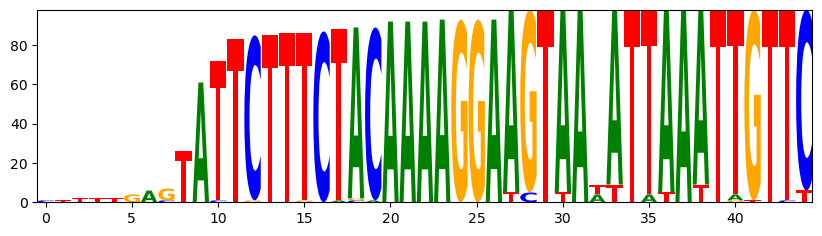

In [11]:
grafico_sequencelogo("Resultados/Alineamiento secuencias patológicas/Resultados alineamiento clustal/clustal algn BRCA1 exon5.afa","fasta",0,45)

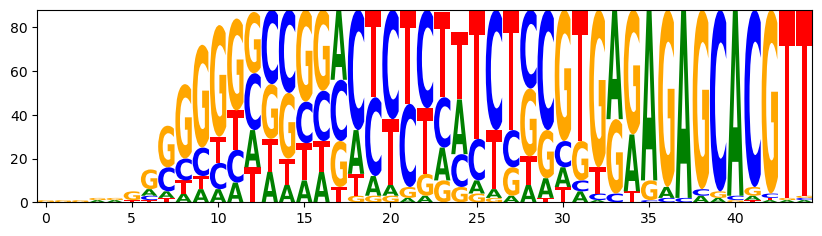

In [10]:
grafico_sequencelogo("Resultados/Alineamiento secuencias patológicas/Resultados alineamiento clustal/clustal algn BRCA1 exon19.afa","fasta",0,45)

**BRCA2**

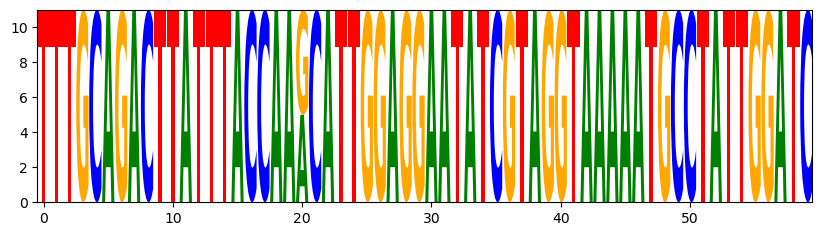

In [676]:
grafico_sequencelogo("Resultados/Alineamiento secuencias patológicas/Resultados alineamiento clustal/clustal algn BRCA2 exon2.afa","fasta",50,110)

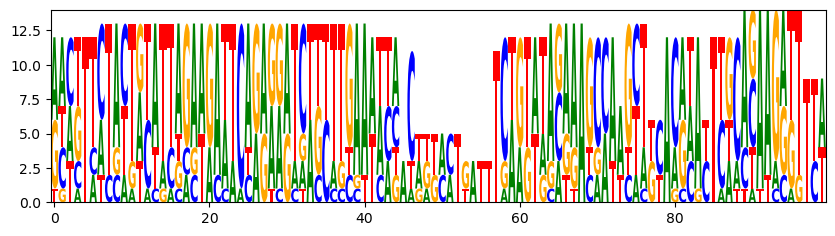

In [25]:
grafico_sequencelogo("Resultados/Alineamiento secuencias patológicas/Resultados alineamiento clustal/clustal algn BRCA2 exon11.afa","fasta",250,350)

**TP53**

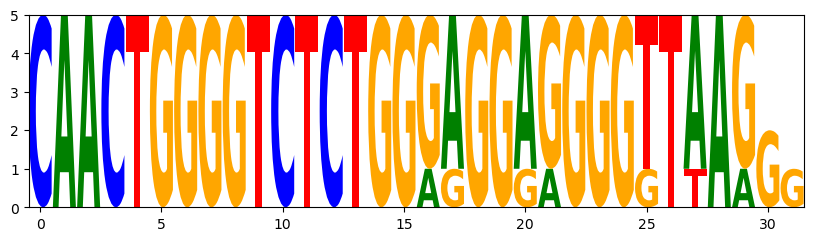

In [24]:
grafico_sequencelogo("Resultados/Alineamiento secuencias patológicas/Resultados alineamiento clustal/clustal algn TP53 exon5.afa","fasta",140,9999)

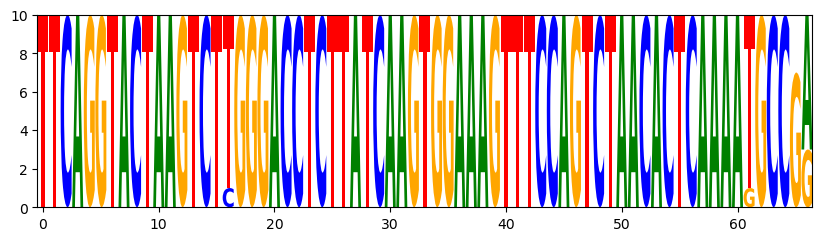

In [85]:
grafico_sequencelogo("Resultados/Alineamiento secuencias patológicas/Resultados alineamiento muscle/muscle algn TP53 exon8.afa","fasta",130,9999)

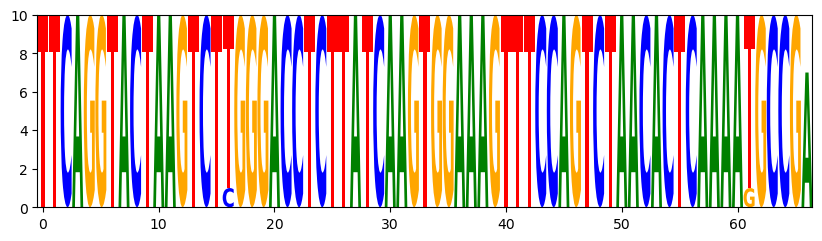

In [31]:
grafico_sequencelogo("Resultados/Alineamiento secuencias patológicas/Resultados alineamiento clustal/clustal algn TP53 exon8.afa","fasta",130,9999)

**PIK3CA**

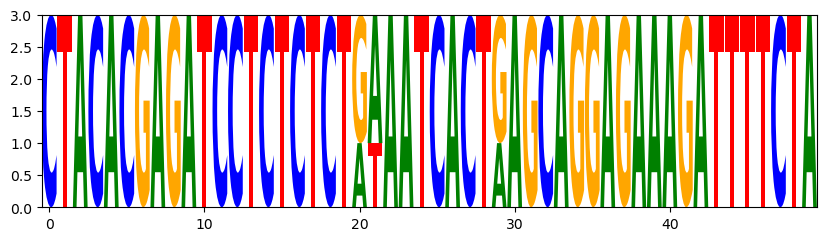

In [42]:
grafico_sequencelogo("Resultados/Alineamiento secuencias patológicas/Resultados alineamiento clustal/clustal algn PIK3CA exon9.afa","fasta",120,170)

### Muscle

**BRCA1**

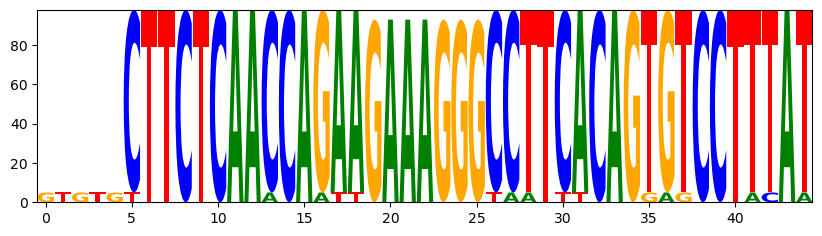

In [93]:
grafico_sequencelogo("Resultados/Alineamiento secuencias patológicas/Resultados alineamiento muscle/muscle algn BRCA1 exon5.afa","fasta",105,150)

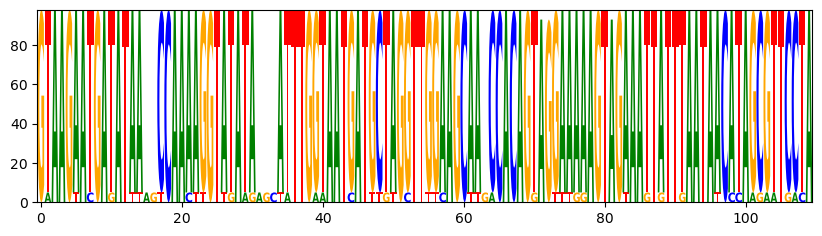

In [95]:
grafico_sequencelogo("Resultados/Alineamiento secuencias patológicas/Resultados alineamiento muscle/muscle algn BRCA1 exon5.afa","fasta",150,260)

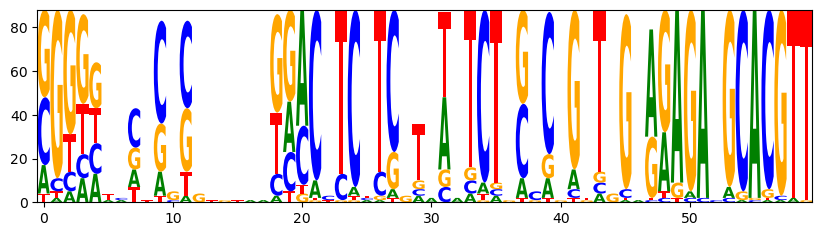

In [96]:
grafico_sequencelogo("Resultados/Alineamiento secuencias patológicas/Resultados alineamiento muscle/muscle algn BRCA1 exon19.afa","fasta",0,60)

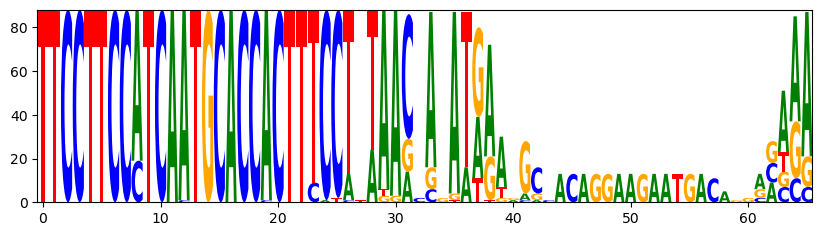

In [97]:
grafico_sequencelogo("Resultados/Alineamiento secuencias patológicas/Resultados alineamiento muscle/muscle algn BRCA1 exon19.afa","fasta",210,999999)

**BRCA2**

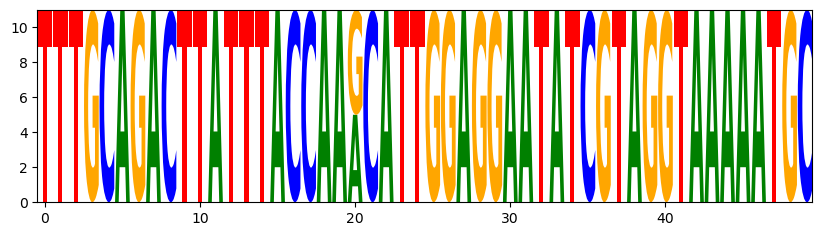

In [98]:
grafico_sequencelogo("Resultados/Alineamiento secuencias patológicas/Resultados alineamiento muscle/muscle algn BRCA2 exon2.afa","fasta",50,100)

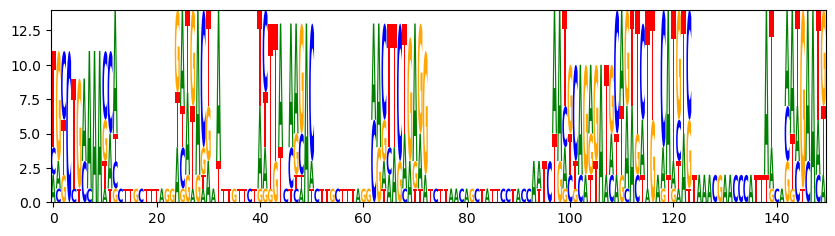

In [99]:
grafico_sequencelogo("Resultados/Alineamiento secuencias patológicas/Resultados alineamiento muscle/muscle algn BRCA2 exon11.afa","fasta",350,500)

**TP53**

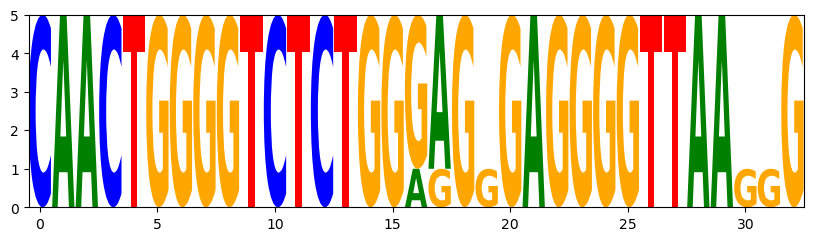

In [100]:
grafico_sequencelogo("Resultados/Alineamiento secuencias patológicas/Resultados alineamiento muscle/muscle algn TP53 exon5.afa","fasta",140,9999)

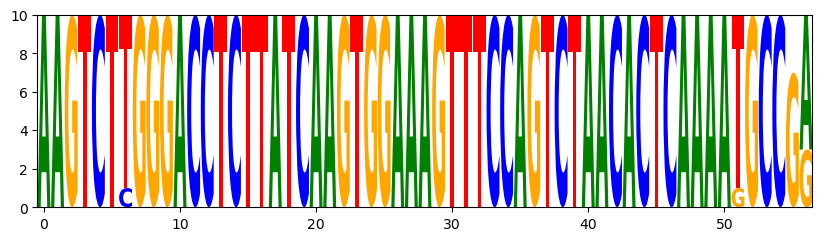

In [101]:
grafico_sequencelogo("Resultados/Alineamiento secuencias patológicas/Resultados alineamiento muscle/muscle algn TP53 exon8.afa","fasta",140,9999)

**PIK3CA**

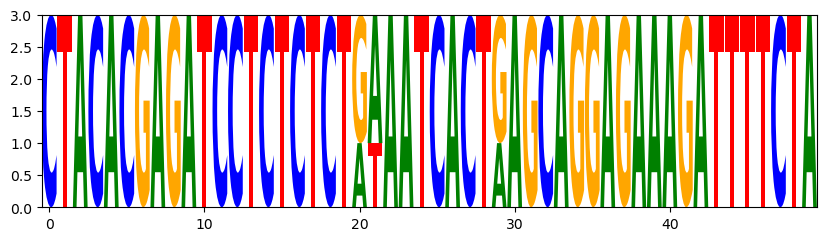

In [108]:
grafico_sequencelogo("Resultados/Alineamiento secuencias patológicas/Resultados alineamiento muscle/muscle algn PIK3CA exon9.afa","fasta",120,170)

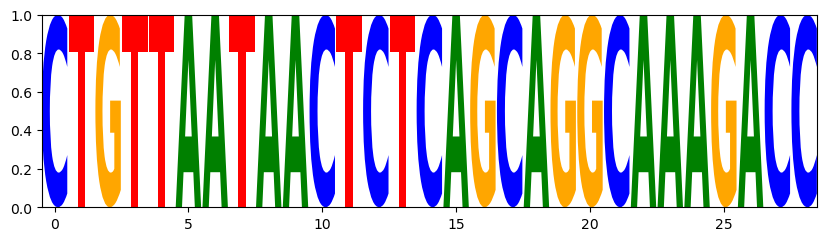

In [112]:
grafico_sequencelogo("Resultados/Alineamiento secuencias patológicas/Resultados alineamiento muscle/muscle algn PIK3CA exon20.afa","fasta",350,600)

### Secuencias control

**Clustal**

**BRCA1**

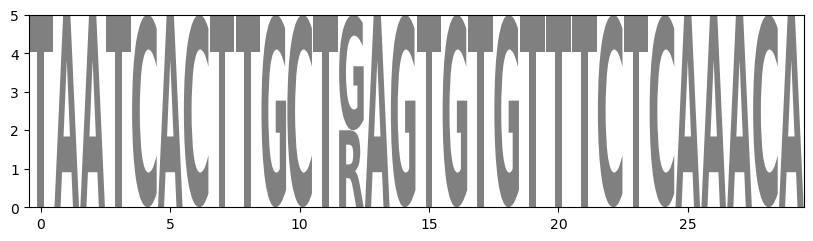

In [135]:
grafico_sequencelogo("Resultados\Alineamiento secuencias control\Resultados alineamiento clustal\clustal control algn BRCA1 exon5.afa","fasta",70,100)

**BRCA2**

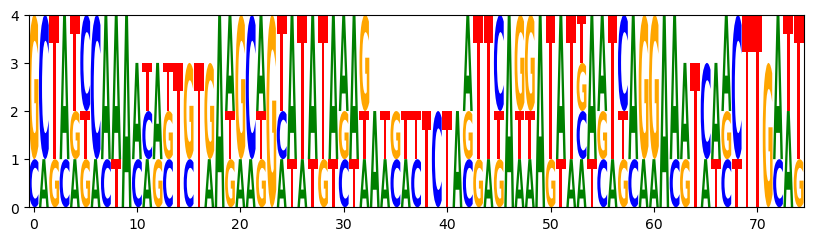

In [71]:
grafico_sequencelogo("Resultados\Alineamiento secuencias control\Resultados alineamiento clustal\clustal control algn BRCA2 exon11.afa","fasta",50,125)

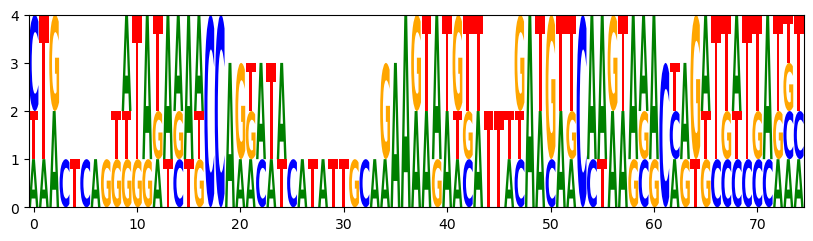

In [76]:
grafico_sequencelogo("Resultados\Alineamiento secuencias control\Resultados alineamiento clustal\clustal control algn BRCA2 exon11.afa","fasta",125,200)

**TP53**

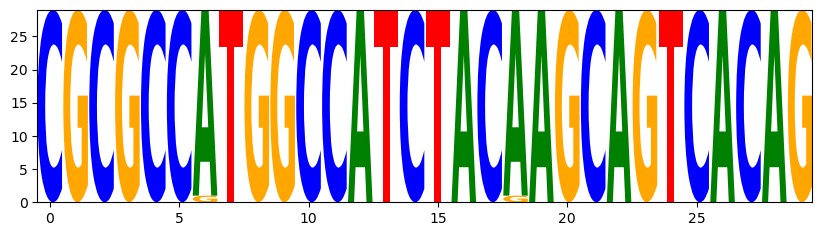

In [79]:
grafico_sequencelogo("Resultados\Alineamiento secuencias control\Resultados alineamiento clustal\clustal control algn TP53 exon5.afa","fasta",30,60)

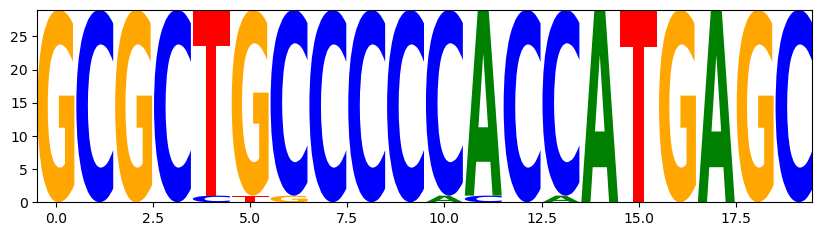

In [81]:
grafico_sequencelogo("Resultados\Alineamiento secuencias control\Resultados alineamiento clustal\clustal control algn TP53 exon5.afa","fasta",80,100)

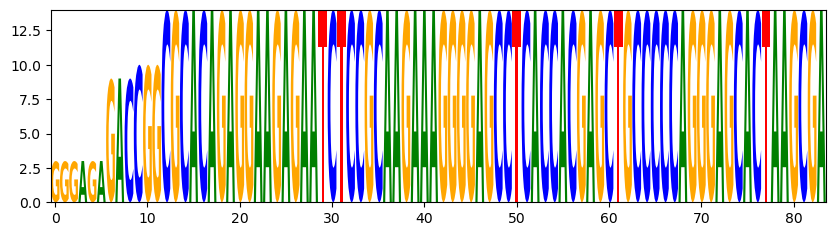

In [82]:
grafico_sequencelogo("Resultados\Alineamiento secuencias control\Resultados alineamiento clustal\clustal control algn TP53 exon8.afa","fasta",0,99999)

**Muscle**

**BRCA1**

Conseguimos dos puntos de interés:

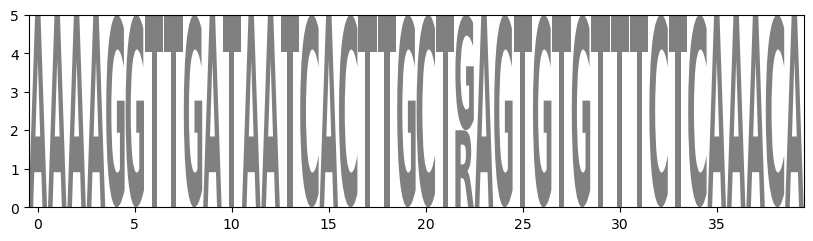

In [121]:
grafico_sequencelogo("Resultados\Alineamiento secuencias control\Resultados alineamiento muscle\muscle control algn BRCA1 exon5.afa","fasta",60,100)

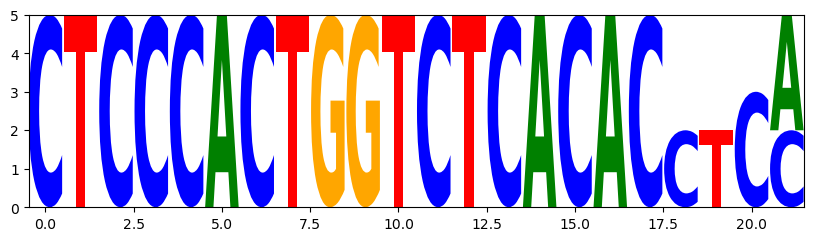

In [129]:
grafico_sequencelogo("Resultados\Alineamiento secuencias control\Resultados alineamiento muscle\muscle control algn BRCA1 exon5.afa","fasta",350,400)

**BRCA2**

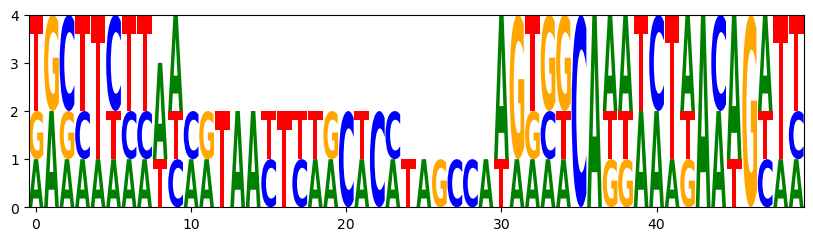

In [130]:
grafico_sequencelogo("Resultados\Alineamiento secuencias control\Resultados alineamiento muscle\muscle control algn BRCA2 exon11.afa","fasta",0,50)

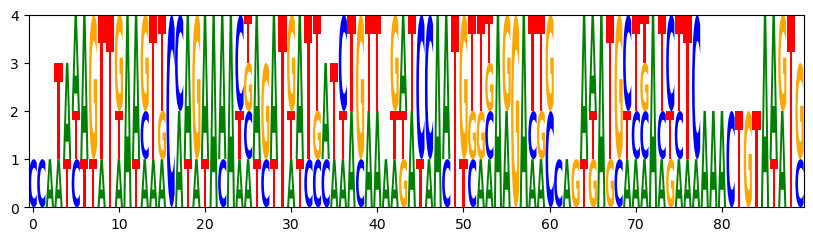

In [131]:
grafico_sequencelogo("Resultados\Alineamiento secuencias control\Resultados alineamiento muscle\muscle control algn BRCA2 exon11.afa","fasta",160,250)

**TP53**

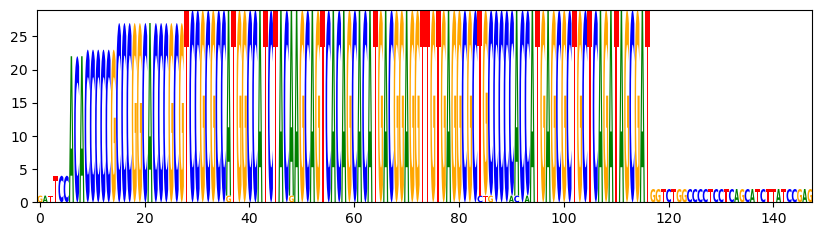

In [134]:
grafico_sequencelogo("Resultados\Alineamiento secuencias control\Resultados alineamiento muscle\muscle control algn TP53 exon5.afa","fasta",0,99999)

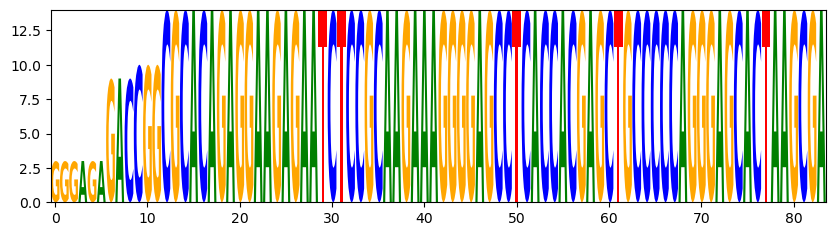

In [114]:
grafico_sequencelogo("Resultados\Alineamiento secuencias control\Resultados alineamiento muscle\muscle control algn TP53 exon8.afa","fasta",0,99999)